# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

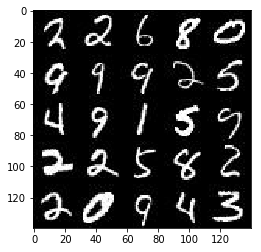

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

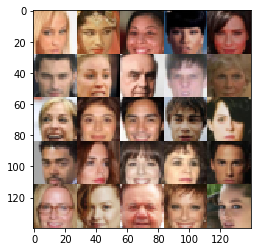

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

ImportError: Traceback (most recent call last):
  File "/home/sttony/devtools/anaconda3/lib/python3.6/site-packages/tensorflow/python/__init__.py", line 61, in <module>
    from tensorflow.python import pywrap_tensorflow
  File "/home/sttony/devtools/anaconda3/lib/python3.6/site-packages/tensorflow/python/pywrap_tensorflow.py", line 28, in <module>
    _pywrap_tensorflow = swig_import_helper()
  File "/home/sttony/devtools/anaconda3/lib/python3.6/site-packages/tensorflow/python/pywrap_tensorflow.py", line 24, in swig_import_helper
    _mod = imp.load_module('_pywrap_tensorflow', fp, pathname, description)
  File "/home/sttony/devtools/anaconda3/lib/python3.6/imp.py", line 242, in load_module
    return load_dynamic(name, filename, file)
  File "/home/sttony/devtools/anaconda3/lib/python3.6/imp.py", line 342, in load_dynamic
    return _load(spec)
ImportError: /home/sttony/devtools/anaconda3/lib/python3.6/site-packages/zmq/backend/cython/../../../../.././libstdc++.so.6: version `GLIBCXX_3.4.21' not found (required by /home/sttony/devtools/anaconda3/lib/python3.6/site-packages/tensorflow/python/_pywrap_tensorflow.so)


Failed to load the native TensorFlow runtime.

See https://github.com/tensorflow/tensorflow/blob/master/tensorflow/g3doc/get_started/os_setup.md#import_error

for some common reasons and solutions.  Include the entire stack trace
above this error message when asking for help.

### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [77]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels ), name='input_real') 
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32)
    return inputs_real, inputs_z, learning_rate



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [78]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.1
    with tf.variable_scope('discriminator', reuse=reuse):
        h1 = tf.layers.conv2d(images, 32, 5, strides=2, padding='same',
                             kernel_initializer=tf.contrib.layers.xavier_initializer())
        # Leaky ReLU
        h1 = tf.maximum(alpha * h1, h1)
        
        h2 = tf.layers.conv2d(h1, 64, 5, strides=2, padding='same',
                             kernel_initializer=tf.contrib.layers.xavier_initializer())
        h3 = tf.layers.batch_normalization(h2, training=True)
        h3 = tf.maximum(alpha * h3, h3)
        
        h3 = tf.layers.conv2d(h3, 128, 5, strides=2, padding='same',
                             kernel_initializer=tf.contrib.layers.xavier_initializer())
        h3 = tf.layers.batch_normalization(h3, training=True)
        h3 = tf.maximum(alpha * h3, h3)
        
        
        h5 = tf.layers.conv2d(h3, 256, 5, strides=2, padding='same',
                             kernel_initializer=tf.contrib.layers.xavier_initializer())
        h5 = tf.layers.batch_normalization(h5, training=True)
        h5 = tf.maximum(alpha * h5, h5)
        
        h5 = tf.nn.dropout(h5, 0.9)
        logits = tf.reshape(h5, (-1, 4*4*256))
        logits = tf.layers.dense(logits, 1, activation=None)
        out = tf.sigmoid(logits)
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [79]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.1
    with tf.variable_scope('generator', reuse=not is_train):
        h1 = tf.layers.dense(z, 4*4*256)
        h1 = tf.reshape(h1, (-1, 4, 4, 256))
        h1 = tf.layers.batch_normalization(h1, training= is_train)
        h1 = tf.maximum(alpha * h1, h1)
                
        h2 = tf.layers.conv2d_transpose(h1, 128, 4, strides=1, padding='valid')
        h2 = tf.layers.batch_normalization(h2, training=is_train)
        h2 = tf.maximum(alpha * h2, h2)
        
        h3 = tf.layers.conv2d_transpose(h2, 64, 5, strides=2, padding='same')
        h3 = tf.layers.batch_normalization(h3, training=is_train)
        h3 = tf.maximum(alpha * h3, h3)
                
        logits = tf.layers.conv2d_transpose(h3, out_channel_dim, 14, strides=2, padding='SAME')
        #print(logits.shape)
        out = tf.tanh(logits)
        
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [80]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smooth = 0.1
    g_model = generator(input_z, out_channel_dim)
    
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    
    d_loss_real = tf.reduce_mean(
                  tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                                          labels=tf.ones_like(d_logits_real) * (1 - smooth)))
    d_loss_fake = tf.reduce_mean(
                  tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                          labels=tf.zeros_like(d_logits_real)))
    d_loss = d_loss_real + d_loss_fake

    
    g_loss = tf.reduce_mean(
             tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                     labels=tf.ones_like(d_logits_fake)))
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [81]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]

    all_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)

    g_update_ops = [var for var in all_update_ops if var.name.startswith('generator')]
    d_update_ops = [var for var in all_update_ops if var.name.startswith('discriminator')]


    # Optimize
    with tf.control_dependencies(d_update_ops): 
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    with tf.control_dependencies(g_update_ops):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [82]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [89]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, _ = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
        
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    step = 0 
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                step += 1
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                batch_images = batch_images*2
                #print(batch_images)
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z})
                if step %10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})                    

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                                     "Discriminator Loss: {:.4f}...".format(train_loss_d),
                                      "Generator Loss: {:.4f}".format(train_loss_g))
                if step %100 == 0:
                    # Sample from generator as we're training for viewing afterwards
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
        show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)

                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 3.9969... Generator Loss: 0.0480
Epoch 1/2... Discriminator Loss: 2.7429... Generator Loss: 0.1480
Epoch 1/2... Discriminator Loss: 2.7049... Generator Loss: 0.1744
Epoch 1/2... Discriminator Loss: 2.1808... Generator Loss: 0.3336
Epoch 1/2... Discriminator Loss: 1.9763... Generator Loss: 0.4369
Epoch 1/2... Discriminator Loss: 1.3853... Generator Loss: 0.5655
Epoch 1/2... Discriminator Loss: 1.5132... Generator Loss: 0.7425
Epoch 1/2... Discriminator Loss: 1.4689... Generator Loss: 0.5408
Epoch 1/2... Discriminator Loss: 1.5631... Generator Loss: 0.5985
Epoch 1/2... Discriminator Loss: 1.6961... Generator Loss: 0.4675


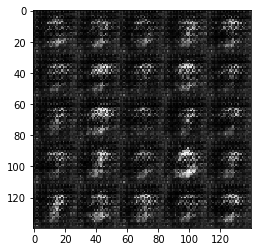

Epoch 1/2... Discriminator Loss: 2.0225... Generator Loss: 0.3499
Epoch 1/2... Discriminator Loss: 2.2159... Generator Loss: 0.3311
Epoch 1/2... Discriminator Loss: 1.7116... Generator Loss: 0.5998
Epoch 1/2... Discriminator Loss: 1.7073... Generator Loss: 0.5387
Epoch 1/2... Discriminator Loss: 1.4731... Generator Loss: 0.6541
Epoch 1/2... Discriminator Loss: 1.7062... Generator Loss: 0.4181
Epoch 1/2... Discriminator Loss: 1.5106... Generator Loss: 0.5245
Epoch 1/2... Discriminator Loss: 1.7895... Generator Loss: 0.6295
Epoch 1/2... Discriminator Loss: 1.9278... Generator Loss: 0.5038
Epoch 1/2... Discriminator Loss: 1.3742... Generator Loss: 0.5703


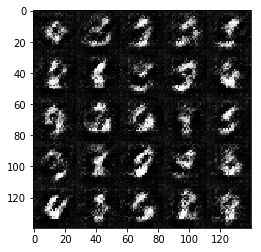

Epoch 1/2... Discriminator Loss: 1.6318... Generator Loss: 0.4911
Epoch 1/2... Discriminator Loss: 1.5907... Generator Loss: 0.4351
Epoch 1/2... Discriminator Loss: 1.4502... Generator Loss: 0.6738
Epoch 1/2... Discriminator Loss: 1.7478... Generator Loss: 0.4284
Epoch 1/2... Discriminator Loss: 1.4557... Generator Loss: 0.6416
Epoch 1/2... Discriminator Loss: 1.5397... Generator Loss: 0.7371
Epoch 1/2... Discriminator Loss: 1.6093... Generator Loss: 0.4757
Epoch 1/2... Discriminator Loss: 1.7297... Generator Loss: 0.5526
Epoch 1/2... Discriminator Loss: 1.5925... Generator Loss: 0.4781
Epoch 1/2... Discriminator Loss: 1.4881... Generator Loss: 0.7250


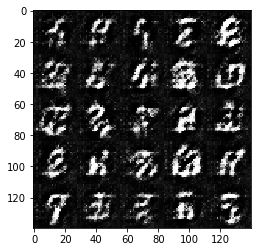

Epoch 1/2... Discriminator Loss: 1.7879... Generator Loss: 0.4428
Epoch 1/2... Discriminator Loss: 1.5340... Generator Loss: 0.4883
Epoch 1/2... Discriminator Loss: 1.5684... Generator Loss: 0.5140
Epoch 1/2... Discriminator Loss: 1.5559... Generator Loss: 0.5628
Epoch 1/2... Discriminator Loss: 1.5398... Generator Loss: 0.5092
Epoch 1/2... Discriminator Loss: 1.5157... Generator Loss: 0.4054
Epoch 1/2... Discriminator Loss: 2.0185... Generator Loss: 0.2982
Epoch 1/2... Discriminator Loss: 1.5053... Generator Loss: 0.6197
Epoch 1/2... Discriminator Loss: 1.5563... Generator Loss: 0.4506
Epoch 1/2... Discriminator Loss: 1.6723... Generator Loss: 0.3558


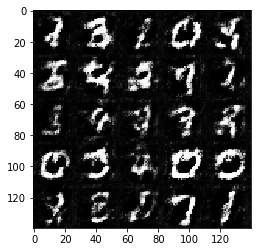

Epoch 1/2... Discriminator Loss: 1.8095... Generator Loss: 0.4530
Epoch 1/2... Discriminator Loss: 1.7437... Generator Loss: 0.3065
Epoch 1/2... Discriminator Loss: 2.1970... Generator Loss: 1.7489
Epoch 1/2... Discriminator Loss: 1.5283... Generator Loss: 0.5154
Epoch 1/2... Discriminator Loss: 1.3743... Generator Loss: 0.4807
Epoch 1/2... Discriminator Loss: 1.4870... Generator Loss: 1.0227
Epoch 1/2... Discriminator Loss: 1.3660... Generator Loss: 0.7541
Epoch 1/2... Discriminator Loss: 1.5582... Generator Loss: 0.5780
Epoch 1/2... Discriminator Loss: 1.6428... Generator Loss: 0.4631
Epoch 1/2... Discriminator Loss: 1.4441... Generator Loss: 0.6054


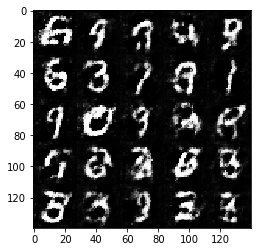

Epoch 1/2... Discriminator Loss: 1.7232... Generator Loss: 0.8494
Epoch 1/2... Discriminator Loss: 1.5790... Generator Loss: 0.2982
Epoch 1/2... Discriminator Loss: 1.6134... Generator Loss: 0.3705
Epoch 1/2... Discriminator Loss: 1.8360... Generator Loss: 0.2695
Epoch 1/2... Discriminator Loss: 1.6636... Generator Loss: 0.4555
Epoch 1/2... Discriminator Loss: 1.7496... Generator Loss: 0.3060
Epoch 1/2... Discriminator Loss: 1.6335... Generator Loss: 0.4458
Epoch 1/2... Discriminator Loss: 1.8565... Generator Loss: 0.3383
Epoch 1/2... Discriminator Loss: 1.8345... Generator Loss: 0.3993
Epoch 1/2... Discriminator Loss: 1.3609... Generator Loss: 0.7207


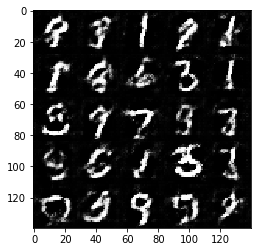

Epoch 1/2... Discriminator Loss: 1.8504... Generator Loss: 0.3581
Epoch 1/2... Discriminator Loss: 1.5781... Generator Loss: 0.4678
Epoch 1/2... Discriminator Loss: 1.6389... Generator Loss: 0.5285
Epoch 1/2... Discriminator Loss: 2.0785... Generator Loss: 0.2149
Epoch 1/2... Discriminator Loss: 1.6721... Generator Loss: 0.5413
Epoch 1/2... Discriminator Loss: 1.6335... Generator Loss: 0.4021
Epoch 1/2... Discriminator Loss: 1.7055... Generator Loss: 0.3570
Epoch 1/2... Discriminator Loss: 1.6746... Generator Loss: 0.3900
Epoch 1/2... Discriminator Loss: 1.5742... Generator Loss: 0.6150
Epoch 1/2... Discriminator Loss: 1.4978... Generator Loss: 1.0697


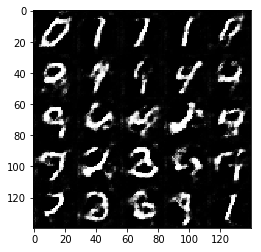

Epoch 1/2... Discriminator Loss: 1.4509... Generator Loss: 0.6959
Epoch 1/2... Discriminator Loss: 2.0112... Generator Loss: 0.2470
Epoch 1/2... Discriminator Loss: 1.6823... Generator Loss: 0.5629
Epoch 1/2... Discriminator Loss: 1.5620... Generator Loss: 0.4499
Epoch 1/2... Discriminator Loss: 1.8081... Generator Loss: 0.2858
Epoch 1/2... Discriminator Loss: 1.2521... Generator Loss: 0.9321
Epoch 1/2... Discriminator Loss: 1.7068... Generator Loss: 0.4527
Epoch 1/2... Discriminator Loss: 1.3471... Generator Loss: 0.6169
Epoch 1/2... Discriminator Loss: 2.0683... Generator Loss: 0.2443
Epoch 1/2... Discriminator Loss: 1.7569... Generator Loss: 0.3476


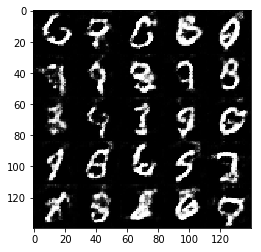

Epoch 1/2... Discriminator Loss: 1.7780... Generator Loss: 0.3727
Epoch 1/2... Discriminator Loss: 1.5274... Generator Loss: 0.5882
Epoch 1/2... Discriminator Loss: 1.9633... Generator Loss: 0.2880
Epoch 1/2... Discriminator Loss: 1.6186... Generator Loss: 0.6604
Epoch 1/2... Discriminator Loss: 1.7918... Generator Loss: 0.2846
Epoch 1/2... Discriminator Loss: 1.8145... Generator Loss: 0.2930
Epoch 1/2... Discriminator Loss: 1.6989... Generator Loss: 0.5575
Epoch 1/2... Discriminator Loss: 1.8121... Generator Loss: 0.3818
Epoch 1/2... Discriminator Loss: 1.9019... Generator Loss: 0.2664
Epoch 1/2... Discriminator Loss: 1.5080... Generator Loss: 0.4736


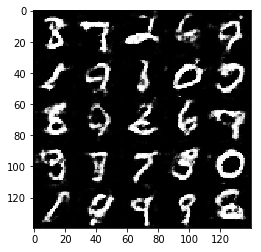

Epoch 1/2... Discriminator Loss: 1.8426... Generator Loss: 0.3293
Epoch 1/2... Discriminator Loss: 1.5423... Generator Loss: 0.5280
Epoch 1/2... Discriminator Loss: 1.7052... Generator Loss: 0.2571
Epoch 2/2... Discriminator Loss: 2.1976... Generator Loss: 0.1948
Epoch 2/2... Discriminator Loss: 1.6781... Generator Loss: 0.3877
Epoch 2/2... Discriminator Loss: 1.3902... Generator Loss: 0.5804
Epoch 2/2... Discriminator Loss: 2.2039... Generator Loss: 0.1762
Epoch 2/2... Discriminator Loss: 1.4463... Generator Loss: 0.5454
Epoch 2/2... Discriminator Loss: 1.7629... Generator Loss: 0.3095
Epoch 2/2... Discriminator Loss: 1.7856... Generator Loss: 1.1478


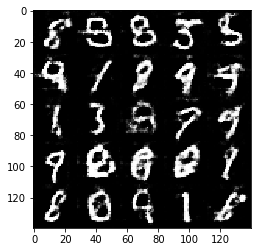

Epoch 2/2... Discriminator Loss: 1.3498... Generator Loss: 0.6426
Epoch 2/2... Discriminator Loss: 1.8450... Generator Loss: 0.2879
Epoch 2/2... Discriminator Loss: 1.5045... Generator Loss: 0.6857
Epoch 2/2... Discriminator Loss: 1.4818... Generator Loss: 0.5681
Epoch 2/2... Discriminator Loss: 1.5854... Generator Loss: 0.4009
Epoch 2/2... Discriminator Loss: 1.5967... Generator Loss: 0.5688
Epoch 2/2... Discriminator Loss: 1.2926... Generator Loss: 1.0103
Epoch 2/2... Discriminator Loss: 1.6125... Generator Loss: 0.5172
Epoch 2/2... Discriminator Loss: 1.7841... Generator Loss: 0.3331
Epoch 2/2... Discriminator Loss: 1.8801... Generator Loss: 0.3353


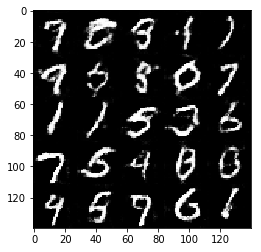

Epoch 2/2... Discriminator Loss: 1.4132... Generator Loss: 0.8807
Epoch 2/2... Discriminator Loss: 2.0609... Generator Loss: 0.2488
Epoch 2/2... Discriminator Loss: 1.3683... Generator Loss: 0.6641
Epoch 2/2... Discriminator Loss: 1.8072... Generator Loss: 0.3131
Epoch 2/2... Discriminator Loss: 1.9041... Generator Loss: 0.3829
Epoch 2/2... Discriminator Loss: 1.7498... Generator Loss: 0.3800
Epoch 2/2... Discriminator Loss: 2.2702... Generator Loss: 0.2413
Epoch 2/2... Discriminator Loss: 1.7417... Generator Loss: 0.3509
Epoch 2/2... Discriminator Loss: 1.4391... Generator Loss: 0.6136
Epoch 2/2... Discriminator Loss: 1.9196... Generator Loss: 0.3034


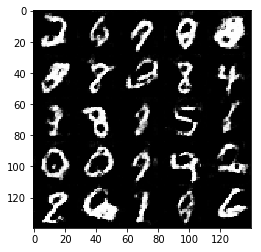

Epoch 2/2... Discriminator Loss: 1.6128... Generator Loss: 0.4654
Epoch 2/2... Discriminator Loss: 1.9185... Generator Loss: 0.2567
Epoch 2/2... Discriminator Loss: 1.4140... Generator Loss: 0.7444
Epoch 2/2... Discriminator Loss: 1.8959... Generator Loss: 0.3299
Epoch 2/2... Discriminator Loss: 1.8939... Generator Loss: 0.2872
Epoch 2/2... Discriminator Loss: 1.8595... Generator Loss: 0.3881
Epoch 2/2... Discriminator Loss: 1.9391... Generator Loss: 0.2767
Epoch 2/2... Discriminator Loss: 1.6801... Generator Loss: 0.3737
Epoch 2/2... Discriminator Loss: 1.5518... Generator Loss: 0.3252
Epoch 2/2... Discriminator Loss: 1.7692... Generator Loss: 0.4309


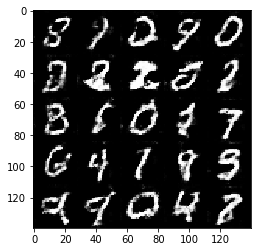

Epoch 2/2... Discriminator Loss: 1.3422... Generator Loss: 0.6153
Epoch 2/2... Discriminator Loss: 1.4893... Generator Loss: 0.8880
Epoch 2/2... Discriminator Loss: 1.8498... Generator Loss: 0.3265
Epoch 2/2... Discriminator Loss: 1.9333... Generator Loss: 0.2646
Epoch 2/2... Discriminator Loss: 1.4769... Generator Loss: 0.6425
Epoch 2/2... Discriminator Loss: 1.4978... Generator Loss: 0.5352
Epoch 2/2... Discriminator Loss: 1.7328... Generator Loss: 0.3566
Epoch 2/2... Discriminator Loss: 1.6085... Generator Loss: 0.4603
Epoch 2/2... Discriminator Loss: 2.4391... Generator Loss: 0.1879
Epoch 2/2... Discriminator Loss: 1.8626... Generator Loss: 0.3024


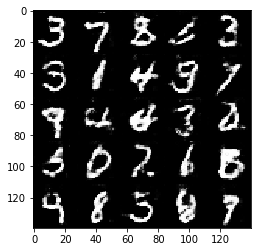

Epoch 2/2... Discriminator Loss: 1.4501... Generator Loss: 0.5076
Epoch 2/2... Discriminator Loss: 1.7726... Generator Loss: 0.3658
Epoch 2/2... Discriminator Loss: 2.0800... Generator Loss: 1.5010
Epoch 2/2... Discriminator Loss: 2.2418... Generator Loss: 0.1531
Epoch 2/2... Discriminator Loss: 1.6503... Generator Loss: 0.3993
Epoch 2/2... Discriminator Loss: 2.6103... Generator Loss: 0.1378
Epoch 2/2... Discriminator Loss: 1.6291... Generator Loss: 0.4022
Epoch 2/2... Discriminator Loss: 1.5818... Generator Loss: 0.4769
Epoch 2/2... Discriminator Loss: 2.3566... Generator Loss: 0.1807
Epoch 2/2... Discriminator Loss: 1.9697... Generator Loss: 0.2287


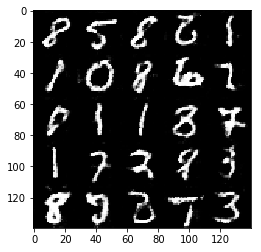

Epoch 2/2... Discriminator Loss: 1.4476... Generator Loss: 0.5766
Epoch 2/2... Discriminator Loss: 1.7340... Generator Loss: 0.3976
Epoch 2/2... Discriminator Loss: 1.7905... Generator Loss: 0.3376
Epoch 2/2... Discriminator Loss: 1.7229... Generator Loss: 0.4463
Epoch 2/2... Discriminator Loss: 1.9399... Generator Loss: 0.2673
Epoch 2/2... Discriminator Loss: 2.0436... Generator Loss: 0.2734
Epoch 2/2... Discriminator Loss: 1.4325... Generator Loss: 0.5799
Epoch 2/2... Discriminator Loss: 2.2506... Generator Loss: 0.1546
Epoch 2/2... Discriminator Loss: 1.7244... Generator Loss: 0.4088
Epoch 2/2... Discriminator Loss: 1.9486... Generator Loss: 0.2746


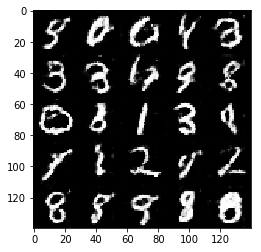

Epoch 2/2... Discriminator Loss: 2.1579... Generator Loss: 0.1885
Epoch 2/2... Discriminator Loss: 2.2952... Generator Loss: 0.2046
Epoch 2/2... Discriminator Loss: 1.8529... Generator Loss: 0.2618
Epoch 2/2... Discriminator Loss: 1.6858... Generator Loss: 0.3363
Epoch 2/2... Discriminator Loss: 1.8395... Generator Loss: 0.3044
Epoch 2/2... Discriminator Loss: 2.1400... Generator Loss: 0.2119
Epoch 2/2... Discriminator Loss: 1.9739... Generator Loss: 0.2872
Epoch 2/2... Discriminator Loss: 1.6265... Generator Loss: 0.5089
Epoch 2/2... Discriminator Loss: 1.5136... Generator Loss: 0.5708
Epoch 2/2... Discriminator Loss: 2.0491... Generator Loss: 0.3040


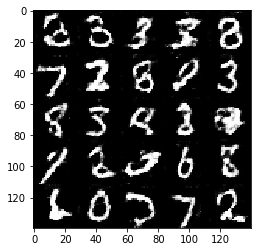

Epoch 2/2... Discriminator Loss: 1.2292... Generator Loss: 0.7847
Epoch 2/2... Discriminator Loss: 2.7286... Generator Loss: 0.1030
Epoch 2/2... Discriminator Loss: 2.0506... Generator Loss: 0.3187
Epoch 2/2... Discriminator Loss: 1.9154... Generator Loss: 0.4671
Epoch 2/2... Discriminator Loss: 2.0417... Generator Loss: 0.2508
Epoch 2/2... Discriminator Loss: 1.8248... Generator Loss: 0.2794
Epoch 2/2... Discriminator Loss: 1.2604... Generator Loss: 0.7286
Epoch 2/2... Discriminator Loss: 1.5095... Generator Loss: 0.4643
Epoch 2/2... Discriminator Loss: 1.6149... Generator Loss: 0.3936
Epoch 2/2... Discriminator Loss: 1.8222... Generator Loss: 0.2551


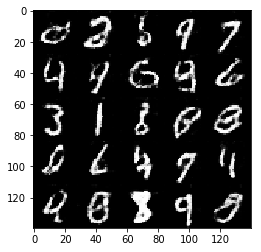

Epoch 2/2... Discriminator Loss: 1.9879... Generator Loss: 0.2456
Epoch 2/2... Discriminator Loss: 1.6926... Generator Loss: 0.4617
Epoch 2/2... Discriminator Loss: 1.8330... Generator Loss: 0.2425
Epoch 2/2... Discriminator Loss: 2.6478... Generator Loss: 0.1269
Epoch 2/2... Discriminator Loss: 1.8023... Generator Loss: 0.4430
Epoch 2/2... Discriminator Loss: 2.5171... Generator Loss: 0.1417
Epoch 2/2... Discriminator Loss: 1.8283... Generator Loss: 0.5805


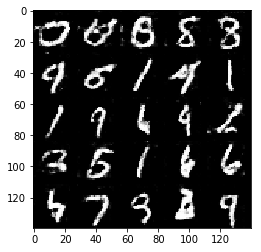

In [90]:
batch_size = 64
z_dim = 100
learning_rate = 0.00015
beta1 = 0.6


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/10... Discriminator Loss: 4.4622... Generator Loss: 0.0185
Epoch 1/10... Discriminator Loss: 2.9027... Generator Loss: 0.0992
Epoch 1/10... Discriminator Loss: 2.2766... Generator Loss: 0.3078
Epoch 1/10... Discriminator Loss: 1.8796... Generator Loss: 0.3884
Epoch 1/10... Discriminator Loss: 1.6208... Generator Loss: 0.4355
Epoch 1/10... Discriminator Loss: 1.3251... Generator Loss: 0.6996
Epoch 1/10... Discriminator Loss: 0.9857... Generator Loss: 1.0589
Epoch 1/10... Discriminator Loss: 1.5763... Generator Loss: 0.7497
Epoch 1/10... Discriminator Loss: 1.4794... Generator Loss: 0.7627
Epoch 1/10... Discriminator Loss: 1.8571... Generator Loss: 0.5219


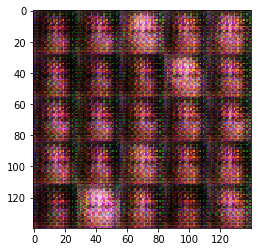

Epoch 1/10... Discriminator Loss: 1.4688... Generator Loss: 0.6938
Epoch 1/10... Discriminator Loss: 1.9179... Generator Loss: 0.3903
Epoch 1/10... Discriminator Loss: 1.7701... Generator Loss: 0.5060
Epoch 1/10... Discriminator Loss: 1.6700... Generator Loss: 0.6253
Epoch 1/10... Discriminator Loss: 1.4540... Generator Loss: 0.8018
Epoch 1/10... Discriminator Loss: 1.7047... Generator Loss: 0.6922
Epoch 1/10... Discriminator Loss: 1.5002... Generator Loss: 0.6224
Epoch 1/10... Discriminator Loss: 1.3562... Generator Loss: 0.7858
Epoch 1/10... Discriminator Loss: 1.5810... Generator Loss: 0.6563
Epoch 1/10... Discriminator Loss: 1.2939... Generator Loss: 0.8801


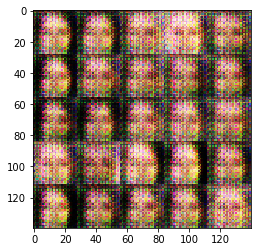

Epoch 1/10... Discriminator Loss: 1.4467... Generator Loss: 0.7367
Epoch 1/10... Discriminator Loss: 1.4900... Generator Loss: 0.6364
Epoch 1/10... Discriminator Loss: 1.5069... Generator Loss: 0.6864
Epoch 1/10... Discriminator Loss: 1.6581... Generator Loss: 0.6324
Epoch 1/10... Discriminator Loss: 1.5285... Generator Loss: 0.7639
Epoch 1/10... Discriminator Loss: 1.6006... Generator Loss: 0.5033
Epoch 1/10... Discriminator Loss: 1.5940... Generator Loss: 0.5981
Epoch 1/10... Discriminator Loss: 1.3862... Generator Loss: 0.7166
Epoch 1/10... Discriminator Loss: 1.4176... Generator Loss: 0.6957
Epoch 1/10... Discriminator Loss: 1.4744... Generator Loss: 0.5932


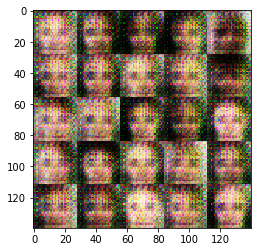

Epoch 1/10... Discriminator Loss: 1.6177... Generator Loss: 0.6837
Epoch 1/10... Discriminator Loss: 1.4171... Generator Loss: 0.7233
Epoch 1/10... Discriminator Loss: 1.7169... Generator Loss: 0.6217
Epoch 1/10... Discriminator Loss: 1.4756... Generator Loss: 0.8949
Epoch 1/10... Discriminator Loss: 1.4522... Generator Loss: 0.5906
Epoch 1/10... Discriminator Loss: 1.6017... Generator Loss: 0.6619
Epoch 1/10... Discriminator Loss: 1.6293... Generator Loss: 0.6284
Epoch 1/10... Discriminator Loss: 1.5131... Generator Loss: 0.7314
Epoch 1/10... Discriminator Loss: 1.3587... Generator Loss: 0.7543
Epoch 1/10... Discriminator Loss: 1.6262... Generator Loss: 0.5985


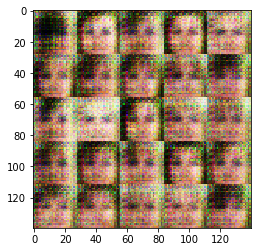

Epoch 1/10... Discriminator Loss: 1.6556... Generator Loss: 0.7563
Epoch 1/10... Discriminator Loss: 1.5980... Generator Loss: 0.6734
Epoch 1/10... Discriminator Loss: 1.6241... Generator Loss: 0.6394
Epoch 1/10... Discriminator Loss: 1.5644... Generator Loss: 0.6172
Epoch 1/10... Discriminator Loss: 1.8860... Generator Loss: 0.5701
Epoch 1/10... Discriminator Loss: 1.6885... Generator Loss: 0.7145
Epoch 1/10... Discriminator Loss: 1.4630... Generator Loss: 0.7709
Epoch 1/10... Discriminator Loss: 1.5156... Generator Loss: 0.6438
Epoch 1/10... Discriminator Loss: 1.5910... Generator Loss: 0.7199
Epoch 1/10... Discriminator Loss: 1.4924... Generator Loss: 0.7370


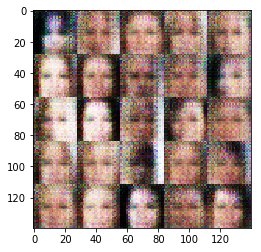

Epoch 1/10... Discriminator Loss: 1.6951... Generator Loss: 0.6683
Epoch 1/10... Discriminator Loss: 1.6671... Generator Loss: 0.5832
Epoch 1/10... Discriminator Loss: 1.4402... Generator Loss: 0.7656
Epoch 1/10... Discriminator Loss: 1.5502... Generator Loss: 0.6341
Epoch 1/10... Discriminator Loss: 1.5216... Generator Loss: 0.7458
Epoch 1/10... Discriminator Loss: 1.6937... Generator Loss: 0.6132
Epoch 1/10... Discriminator Loss: 1.5327... Generator Loss: 0.8747
Epoch 1/10... Discriminator Loss: 1.4099... Generator Loss: 0.7386
Epoch 1/10... Discriminator Loss: 1.4391... Generator Loss: 0.5833
Epoch 1/10... Discriminator Loss: 1.5623... Generator Loss: 0.6556


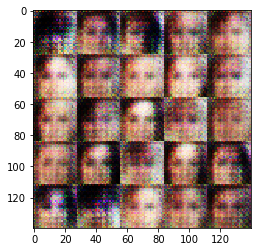

Epoch 1/10... Discriminator Loss: 1.6922... Generator Loss: 0.5710
Epoch 1/10... Discriminator Loss: 1.5355... Generator Loss: 0.6753
Epoch 1/10... Discriminator Loss: 1.6540... Generator Loss: 0.5984
Epoch 1/10... Discriminator Loss: 1.5579... Generator Loss: 0.6553
Epoch 1/10... Discriminator Loss: 1.4290... Generator Loss: 0.6715
Epoch 1/10... Discriminator Loss: 1.7027... Generator Loss: 0.6784
Epoch 1/10... Discriminator Loss: 1.4498... Generator Loss: 0.8240
Epoch 1/10... Discriminator Loss: 1.5310... Generator Loss: 0.7292
Epoch 1/10... Discriminator Loss: 1.4682... Generator Loss: 0.6552
Epoch 1/10... Discriminator Loss: 1.4992... Generator Loss: 0.7289


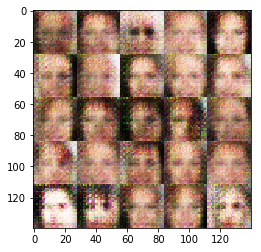

Epoch 1/10... Discriminator Loss: 1.4960... Generator Loss: 0.6135
Epoch 1/10... Discriminator Loss: 1.5379... Generator Loss: 0.6918
Epoch 1/10... Discriminator Loss: 1.3854... Generator Loss: 0.8006
Epoch 1/10... Discriminator Loss: 1.5374... Generator Loss: 0.6921
Epoch 1/10... Discriminator Loss: 1.5438... Generator Loss: 0.6103
Epoch 1/10... Discriminator Loss: 1.3754... Generator Loss: 0.6695
Epoch 1/10... Discriminator Loss: 1.6187... Generator Loss: 0.6972
Epoch 1/10... Discriminator Loss: 1.5112... Generator Loss: 0.6185
Epoch 1/10... Discriminator Loss: 1.4483... Generator Loss: 0.8141
Epoch 1/10... Discriminator Loss: 1.5540... Generator Loss: 0.6898


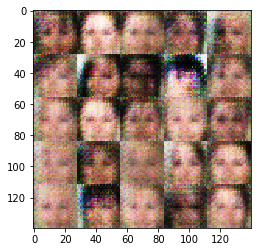

Epoch 1/10... Discriminator Loss: 1.4922... Generator Loss: 0.8073
Epoch 1/10... Discriminator Loss: 1.4404... Generator Loss: 0.7307
Epoch 1/10... Discriminator Loss: 1.4456... Generator Loss: 0.7810
Epoch 1/10... Discriminator Loss: 1.6304... Generator Loss: 0.6704
Epoch 1/10... Discriminator Loss: 1.4885... Generator Loss: 0.6697
Epoch 1/10... Discriminator Loss: 1.4887... Generator Loss: 0.6602
Epoch 1/10... Discriminator Loss: 1.6131... Generator Loss: 0.7058
Epoch 1/10... Discriminator Loss: 1.4647... Generator Loss: 0.7593
Epoch 1/10... Discriminator Loss: 1.5809... Generator Loss: 0.7361
Epoch 1/10... Discriminator Loss: 1.4918... Generator Loss: 0.7726


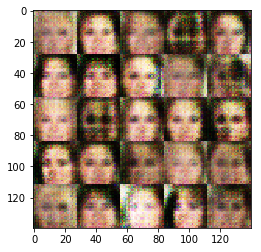

Epoch 1/10... Discriminator Loss: 1.5281... Generator Loss: 0.6448
Epoch 1/10... Discriminator Loss: 1.4885... Generator Loss: 0.6712
Epoch 1/10... Discriminator Loss: 1.4515... Generator Loss: 0.7160
Epoch 1/10... Discriminator Loss: 1.3866... Generator Loss: 0.7149
Epoch 1/10... Discriminator Loss: 1.5012... Generator Loss: 0.7291
Epoch 1/10... Discriminator Loss: 1.5053... Generator Loss: 0.7174
Epoch 1/10... Discriminator Loss: 1.5019... Generator Loss: 0.7270
Epoch 1/10... Discriminator Loss: 1.5195... Generator Loss: 0.6946
Epoch 1/10... Discriminator Loss: 1.4326... Generator Loss: 0.6652
Epoch 1/10... Discriminator Loss: 1.4176... Generator Loss: 0.7986


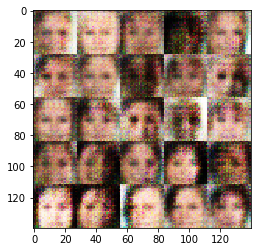

Epoch 1/10... Discriminator Loss: 1.4859... Generator Loss: 0.7511
Epoch 1/10... Discriminator Loss: 1.5202... Generator Loss: 0.6921
Epoch 1/10... Discriminator Loss: 1.4438... Generator Loss: 0.7702
Epoch 1/10... Discriminator Loss: 1.5045... Generator Loss: 0.6676
Epoch 1/10... Discriminator Loss: 1.5135... Generator Loss: 0.7291
Epoch 1/10... Discriminator Loss: 1.4586... Generator Loss: 0.8541
Epoch 1/10... Discriminator Loss: 1.4765... Generator Loss: 0.7658
Epoch 1/10... Discriminator Loss: 1.6320... Generator Loss: 0.5903
Epoch 1/10... Discriminator Loss: 1.5041... Generator Loss: 0.7191
Epoch 1/10... Discriminator Loss: 1.4855... Generator Loss: 0.7420


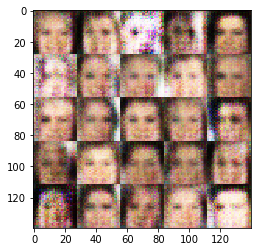

Epoch 1/10... Discriminator Loss: 1.4232... Generator Loss: 0.6985
Epoch 1/10... Discriminator Loss: 1.4364... Generator Loss: 0.6665
Epoch 1/10... Discriminator Loss: 1.3822... Generator Loss: 0.7481
Epoch 1/10... Discriminator Loss: 1.5516... Generator Loss: 0.6857
Epoch 1/10... Discriminator Loss: 1.5343... Generator Loss: 0.7313
Epoch 1/10... Discriminator Loss: 1.4754... Generator Loss: 0.6922
Epoch 1/10... Discriminator Loss: 1.5539... Generator Loss: 0.7100
Epoch 1/10... Discriminator Loss: 1.5056... Generator Loss: 0.6940
Epoch 1/10... Discriminator Loss: 1.5622... Generator Loss: 0.6711
Epoch 1/10... Discriminator Loss: 1.6068... Generator Loss: 0.6611


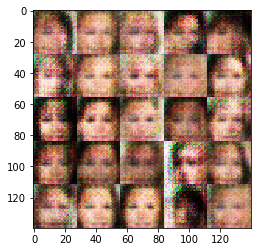

Epoch 1/10... Discriminator Loss: 1.4501... Generator Loss: 0.7855
Epoch 1/10... Discriminator Loss: 1.4836... Generator Loss: 0.7114
Epoch 1/10... Discriminator Loss: 1.5708... Generator Loss: 0.7256
Epoch 1/10... Discriminator Loss: 1.4491... Generator Loss: 0.7885
Epoch 1/10... Discriminator Loss: 1.5077... Generator Loss: 0.6328
Epoch 1/10... Discriminator Loss: 1.3497... Generator Loss: 0.8673
Epoch 1/10... Discriminator Loss: 1.5604... Generator Loss: 0.7006
Epoch 1/10... Discriminator Loss: 1.6330... Generator Loss: 0.7219
Epoch 1/10... Discriminator Loss: 1.4716... Generator Loss: 0.6521
Epoch 1/10... Discriminator Loss: 1.4838... Generator Loss: 0.6558


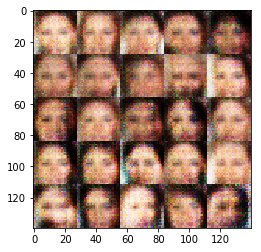

Epoch 1/10... Discriminator Loss: 1.4338... Generator Loss: 0.7349
Epoch 1/10... Discriminator Loss: 1.3968... Generator Loss: 0.7605
Epoch 1/10... Discriminator Loss: 1.4433... Generator Loss: 0.6690
Epoch 1/10... Discriminator Loss: 1.4362... Generator Loss: 0.8240
Epoch 1/10... Discriminator Loss: 1.5558... Generator Loss: 0.6896
Epoch 1/10... Discriminator Loss: 1.5328... Generator Loss: 0.6844
Epoch 1/10... Discriminator Loss: 1.4214... Generator Loss: 0.6683
Epoch 1/10... Discriminator Loss: 1.4118... Generator Loss: 0.7161
Epoch 1/10... Discriminator Loss: 1.6752... Generator Loss: 0.6568
Epoch 1/10... Discriminator Loss: 1.4874... Generator Loss: 0.6893


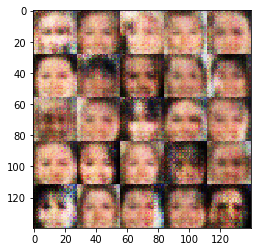

Epoch 1/10... Discriminator Loss: 1.5693... Generator Loss: 0.7682
Epoch 1/10... Discriminator Loss: 1.4384... Generator Loss: 0.7315
Epoch 1/10... Discriminator Loss: 1.3453... Generator Loss: 0.7224
Epoch 1/10... Discriminator Loss: 1.4423... Generator Loss: 0.6774
Epoch 1/10... Discriminator Loss: 1.4791... Generator Loss: 0.7191
Epoch 1/10... Discriminator Loss: 1.5275... Generator Loss: 0.5872
Epoch 1/10... Discriminator Loss: 1.4240... Generator Loss: 0.7587
Epoch 1/10... Discriminator Loss: 1.5488... Generator Loss: 0.6366
Epoch 1/10... Discriminator Loss: 1.4544... Generator Loss: 0.7492
Epoch 1/10... Discriminator Loss: 1.4814... Generator Loss: 0.6715


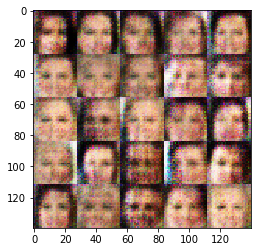

Epoch 1/10... Discriminator Loss: 1.4323... Generator Loss: 0.6778
Epoch 1/10... Discriminator Loss: 1.3756... Generator Loss: 0.7258
Epoch 1/10... Discriminator Loss: 1.4410... Generator Loss: 0.6572
Epoch 1/10... Discriminator Loss: 1.5688... Generator Loss: 0.6674
Epoch 1/10... Discriminator Loss: 1.4368... Generator Loss: 0.8005
Epoch 1/10... Discriminator Loss: 1.4525... Generator Loss: 0.7635
Epoch 1/10... Discriminator Loss: 1.4620... Generator Loss: 0.7882
Epoch 1/10... Discriminator Loss: 1.4250... Generator Loss: 0.7330
Epoch 1/10... Discriminator Loss: 1.4815... Generator Loss: 0.7138
Epoch 1/10... Discriminator Loss: 1.4839... Generator Loss: 0.7513


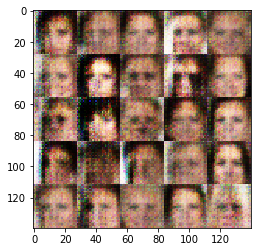

Epoch 1/10... Discriminator Loss: 1.3727... Generator Loss: 0.7592
Epoch 1/10... Discriminator Loss: 1.5220... Generator Loss: 0.6983
Epoch 1/10... Discriminator Loss: 1.4671... Generator Loss: 0.6953
Epoch 1/10... Discriminator Loss: 1.5000... Generator Loss: 0.7207
Epoch 1/10... Discriminator Loss: 1.5436... Generator Loss: 0.6863
Epoch 1/10... Discriminator Loss: 1.5883... Generator Loss: 0.7309
Epoch 1/10... Discriminator Loss: 1.5029... Generator Loss: 0.8007
Epoch 1/10... Discriminator Loss: 1.5697... Generator Loss: 0.6299
Epoch 1/10... Discriminator Loss: 1.4769... Generator Loss: 0.7193
Epoch 1/10... Discriminator Loss: 1.3708... Generator Loss: 0.8085


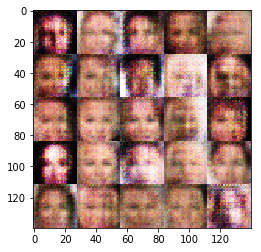

Epoch 1/10... Discriminator Loss: 1.6181... Generator Loss: 0.6307
Epoch 1/10... Discriminator Loss: 1.4174... Generator Loss: 0.7419
Epoch 1/10... Discriminator Loss: 1.4554... Generator Loss: 0.6708
Epoch 1/10... Discriminator Loss: 1.5499... Generator Loss: 0.6877
Epoch 1/10... Discriminator Loss: 1.4559... Generator Loss: 0.6875
Epoch 1/10... Discriminator Loss: 1.5243... Generator Loss: 0.7578
Epoch 1/10... Discriminator Loss: 1.5062... Generator Loss: 0.6874
Epoch 1/10... Discriminator Loss: 1.3852... Generator Loss: 0.7334
Epoch 1/10... Discriminator Loss: 1.5181... Generator Loss: 0.7359
Epoch 1/10... Discriminator Loss: 1.4356... Generator Loss: 0.7503


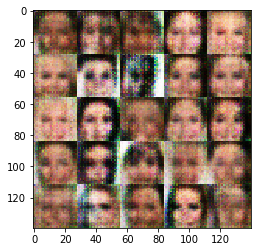

Epoch 1/10... Discriminator Loss: 1.5095... Generator Loss: 0.6506
Epoch 1/10... Discriminator Loss: 1.4661... Generator Loss: 0.6929
Epoch 1/10... Discriminator Loss: 1.4822... Generator Loss: 0.8180
Epoch 1/10... Discriminator Loss: 1.4824... Generator Loss: 0.6805
Epoch 1/10... Discriminator Loss: 1.3784... Generator Loss: 0.7577
Epoch 1/10... Discriminator Loss: 1.4542... Generator Loss: 0.6912
Epoch 1/10... Discriminator Loss: 1.4709... Generator Loss: 0.7361
Epoch 1/10... Discriminator Loss: 1.4370... Generator Loss: 0.7450
Epoch 1/10... Discriminator Loss: 1.4591... Generator Loss: 0.6610
Epoch 1/10... Discriminator Loss: 1.4825... Generator Loss: 0.7815


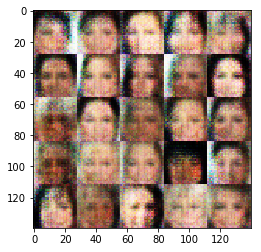

Epoch 1/10... Discriminator Loss: 1.4348... Generator Loss: 0.7458
Epoch 1/10... Discriminator Loss: 1.4604... Generator Loss: 0.6948
Epoch 1/10... Discriminator Loss: 1.4765... Generator Loss: 0.7104
Epoch 1/10... Discriminator Loss: 1.4590... Generator Loss: 0.7360
Epoch 1/10... Discriminator Loss: 1.4623... Generator Loss: 0.6862
Epoch 1/10... Discriminator Loss: 1.4868... Generator Loss: 0.6940
Epoch 1/10... Discriminator Loss: 1.5368... Generator Loss: 0.7161
Epoch 1/10... Discriminator Loss: 1.5317... Generator Loss: 0.6601
Epoch 1/10... Discriminator Loss: 1.5447... Generator Loss: 0.7193
Epoch 1/10... Discriminator Loss: 1.3848... Generator Loss: 0.7481


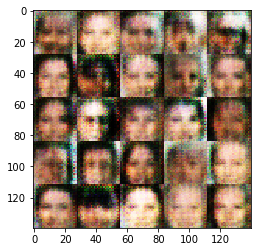

Epoch 1/10... Discriminator Loss: 1.4405... Generator Loss: 0.7578
Epoch 1/10... Discriminator Loss: 1.4862... Generator Loss: 0.7036
Epoch 1/10... Discriminator Loss: 1.5327... Generator Loss: 0.7094
Epoch 1/10... Discriminator Loss: 1.4708... Generator Loss: 0.6564
Epoch 1/10... Discriminator Loss: 1.4496... Generator Loss: 0.6569
Epoch 1/10... Discriminator Loss: 1.5459... Generator Loss: 0.6673
Epoch 1/10... Discriminator Loss: 1.4554... Generator Loss: 0.7397
Epoch 1/10... Discriminator Loss: 1.5459... Generator Loss: 0.7113
Epoch 1/10... Discriminator Loss: 1.4237... Generator Loss: 0.7326
Epoch 1/10... Discriminator Loss: 1.4612... Generator Loss: 0.6812


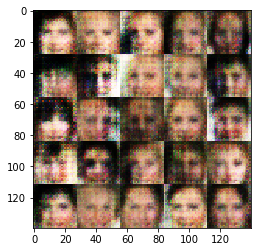

Epoch 1/10... Discriminator Loss: 1.4183... Generator Loss: 0.6796
Epoch 1/10... Discriminator Loss: 1.4567... Generator Loss: 0.7524
Epoch 1/10... Discriminator Loss: 1.4922... Generator Loss: 0.6869
Epoch 1/10... Discriminator Loss: 1.4053... Generator Loss: 0.7813
Epoch 1/10... Discriminator Loss: 1.5298... Generator Loss: 0.6765
Epoch 1/10... Discriminator Loss: 1.4059... Generator Loss: 0.7273
Epoch 1/10... Discriminator Loss: 1.3777... Generator Loss: 0.7989
Epoch 1/10... Discriminator Loss: 1.5100... Generator Loss: 0.7718
Epoch 1/10... Discriminator Loss: 1.4959... Generator Loss: 0.6941
Epoch 1/10... Discriminator Loss: 1.4051... Generator Loss: 0.7368


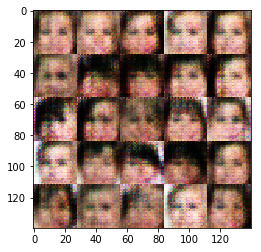

Epoch 1/10... Discriminator Loss: 1.4757... Generator Loss: 0.7079
Epoch 1/10... Discriminator Loss: 1.5657... Generator Loss: 0.6592
Epoch 1/10... Discriminator Loss: 1.3991... Generator Loss: 0.6708
Epoch 1/10... Discriminator Loss: 1.4734... Generator Loss: 0.7424
Epoch 1/10... Discriminator Loss: 1.5409... Generator Loss: 0.6468
Epoch 1/10... Discriminator Loss: 1.4736... Generator Loss: 0.6495
Epoch 1/10... Discriminator Loss: 1.4167... Generator Loss: 0.6774
Epoch 1/10... Discriminator Loss: 1.4290... Generator Loss: 0.6446
Epoch 1/10... Discriminator Loss: 1.4707... Generator Loss: 0.6532
Epoch 1/10... Discriminator Loss: 1.5390... Generator Loss: 0.6639


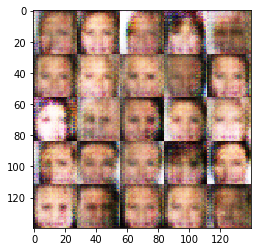

Epoch 1/10... Discriminator Loss: 1.4870... Generator Loss: 0.6744
Epoch 1/10... Discriminator Loss: 1.4568... Generator Loss: 0.7287
Epoch 1/10... Discriminator Loss: 1.4701... Generator Loss: 0.6747
Epoch 1/10... Discriminator Loss: 1.4072... Generator Loss: 0.6998
Epoch 1/10... Discriminator Loss: 1.5081... Generator Loss: 0.7791
Epoch 1/10... Discriminator Loss: 1.4884... Generator Loss: 0.6969
Epoch 1/10... Discriminator Loss: 1.4467... Generator Loss: 0.6635
Epoch 1/10... Discriminator Loss: 1.4674... Generator Loss: 0.7308
Epoch 1/10... Discriminator Loss: 1.3277... Generator Loss: 0.7985
Epoch 1/10... Discriminator Loss: 1.4751... Generator Loss: 0.6723


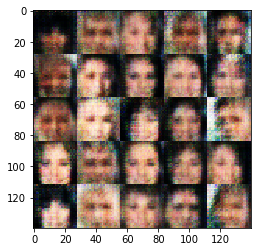

Epoch 1/10... Discriminator Loss: 1.4804... Generator Loss: 0.7114
Epoch 1/10... Discriminator Loss: 1.4995... Generator Loss: 0.6618
Epoch 1/10... Discriminator Loss: 1.4315... Generator Loss: 0.6469
Epoch 1/10... Discriminator Loss: 1.5243... Generator Loss: 0.7230
Epoch 1/10... Discriminator Loss: 1.4256... Generator Loss: 0.7137
Epoch 1/10... Discriminator Loss: 1.5274... Generator Loss: 0.7172
Epoch 1/10... Discriminator Loss: 1.4875... Generator Loss: 0.7549
Epoch 1/10... Discriminator Loss: 1.5454... Generator Loss: 0.6615
Epoch 1/10... Discriminator Loss: 1.5154... Generator Loss: 0.7679
Epoch 1/10... Discriminator Loss: 1.4721... Generator Loss: 0.7001


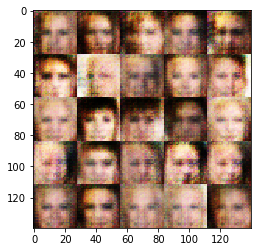

Epoch 1/10... Discriminator Loss: 1.4722... Generator Loss: 0.6952
Epoch 1/10... Discriminator Loss: 1.4038... Generator Loss: 0.6713
Epoch 1/10... Discriminator Loss: 1.4540... Generator Loss: 0.7137
Epoch 1/10... Discriminator Loss: 1.4390... Generator Loss: 0.7352
Epoch 1/10... Discriminator Loss: 1.5475... Generator Loss: 0.7003
Epoch 1/10... Discriminator Loss: 1.4954... Generator Loss: 0.6990
Epoch 1/10... Discriminator Loss: 1.4683... Generator Loss: 0.6928
Epoch 1/10... Discriminator Loss: 1.4934... Generator Loss: 0.7176
Epoch 1/10... Discriminator Loss: 1.4429... Generator Loss: 0.7815
Epoch 1/10... Discriminator Loss: 1.3518... Generator Loss: 0.8256


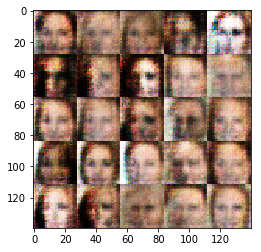

Epoch 1/10... Discriminator Loss: 1.4446... Generator Loss: 0.7067
Epoch 1/10... Discriminator Loss: 1.5525... Generator Loss: 0.6295
Epoch 1/10... Discriminator Loss: 1.4834... Generator Loss: 0.7114
Epoch 1/10... Discriminator Loss: 1.4435... Generator Loss: 0.7116
Epoch 1/10... Discriminator Loss: 1.4480... Generator Loss: 0.7283
Epoch 1/10... Discriminator Loss: 1.4699... Generator Loss: 0.6678
Epoch 1/10... Discriminator Loss: 1.4587... Generator Loss: 0.6508
Epoch 1/10... Discriminator Loss: 1.4699... Generator Loss: 0.7861
Epoch 1/10... Discriminator Loss: 1.4018... Generator Loss: 0.7628
Epoch 1/10... Discriminator Loss: 1.4474... Generator Loss: 0.7090


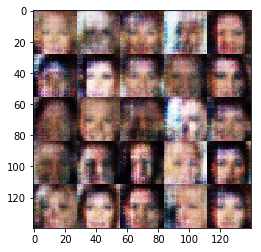

Epoch 1/10... Discriminator Loss: 1.4802... Generator Loss: 0.6725
Epoch 1/10... Discriminator Loss: 1.5904... Generator Loss: 0.6878
Epoch 1/10... Discriminator Loss: 1.4457... Generator Loss: 0.7011
Epoch 1/10... Discriminator Loss: 1.4094... Generator Loss: 0.7015
Epoch 1/10... Discriminator Loss: 1.4673... Generator Loss: 0.7476
Epoch 1/10... Discriminator Loss: 1.4372... Generator Loss: 0.7672
Epoch 1/10... Discriminator Loss: 1.4887... Generator Loss: 0.7362
Epoch 1/10... Discriminator Loss: 1.4795... Generator Loss: 0.7433
Epoch 1/10... Discriminator Loss: 1.4437... Generator Loss: 0.7825
Epoch 1/10... Discriminator Loss: 1.4053... Generator Loss: 0.6429


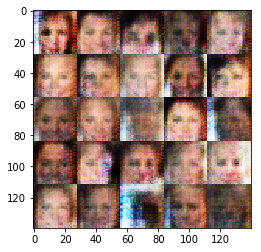

Epoch 1/10... Discriminator Loss: 1.5111... Generator Loss: 0.6770
Epoch 1/10... Discriminator Loss: 1.4768... Generator Loss: 0.7289
Epoch 1/10... Discriminator Loss: 1.4368... Generator Loss: 0.7429
Epoch 1/10... Discriminator Loss: 1.4520... Generator Loss: 0.7493
Epoch 1/10... Discriminator Loss: 1.4540... Generator Loss: 0.7497
Epoch 1/10... Discriminator Loss: 1.3988... Generator Loss: 0.7382
Epoch 1/10... Discriminator Loss: 1.4471... Generator Loss: 0.7308
Epoch 1/10... Discriminator Loss: 1.4103... Generator Loss: 0.8076
Epoch 1/10... Discriminator Loss: 1.5302... Generator Loss: 0.7274
Epoch 1/10... Discriminator Loss: 1.4269... Generator Loss: 0.7846


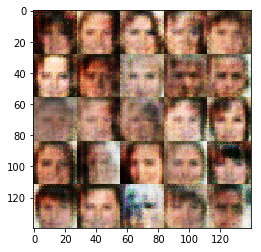

Epoch 1/10... Discriminator Loss: 1.5032... Generator Loss: 0.7161
Epoch 1/10... Discriminator Loss: 1.4372... Generator Loss: 0.7373
Epoch 1/10... Discriminator Loss: 1.4416... Generator Loss: 0.7272
Epoch 1/10... Discriminator Loss: 1.4397... Generator Loss: 0.7669
Epoch 1/10... Discriminator Loss: 1.4791... Generator Loss: 0.7461
Epoch 1/10... Discriminator Loss: 1.5125... Generator Loss: 0.6449
Epoch 1/10... Discriminator Loss: 1.5136... Generator Loss: 0.7327
Epoch 1/10... Discriminator Loss: 1.4086... Generator Loss: 0.7507
Epoch 1/10... Discriminator Loss: 1.5362... Generator Loss: 0.7284
Epoch 1/10... Discriminator Loss: 1.4263... Generator Loss: 0.7483


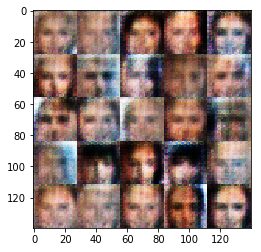

Epoch 1/10... Discriminator Loss: 1.4480... Generator Loss: 0.7108
Epoch 1/10... Discriminator Loss: 1.5372... Generator Loss: 0.6596
Epoch 1/10... Discriminator Loss: 1.4111... Generator Loss: 0.7427
Epoch 1/10... Discriminator Loss: 1.4141... Generator Loss: 0.7715
Epoch 1/10... Discriminator Loss: 1.3876... Generator Loss: 0.6863
Epoch 1/10... Discriminator Loss: 1.3765... Generator Loss: 0.7116
Epoch 1/10... Discriminator Loss: 1.5947... Generator Loss: 0.7144
Epoch 1/10... Discriminator Loss: 1.3990... Generator Loss: 0.7315
Epoch 1/10... Discriminator Loss: 1.4217... Generator Loss: 0.7273
Epoch 1/10... Discriminator Loss: 1.5362... Generator Loss: 0.7248


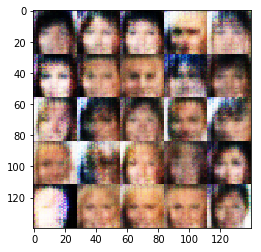

Epoch 1/10... Discriminator Loss: 1.4812... Generator Loss: 0.6575
Epoch 1/10... Discriminator Loss: 1.4192... Generator Loss: 0.7828
Epoch 1/10... Discriminator Loss: 1.4410... Generator Loss: 0.7308
Epoch 1/10... Discriminator Loss: 1.4507... Generator Loss: 0.7495
Epoch 1/10... Discriminator Loss: 1.4790... Generator Loss: 0.7073
Epoch 1/10... Discriminator Loss: 1.4346... Generator Loss: 0.8090
Epoch 2/10... Discriminator Loss: 1.4021... Generator Loss: 0.8686
Epoch 2/10... Discriminator Loss: 1.4297... Generator Loss: 0.8084
Epoch 2/10... Discriminator Loss: 1.3921... Generator Loss: 0.7032
Epoch 2/10... Discriminator Loss: 1.4545... Generator Loss: 0.7360


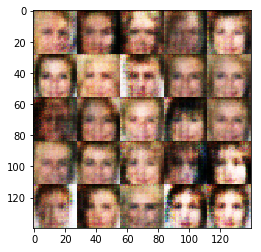

Epoch 2/10... Discriminator Loss: 1.4894... Generator Loss: 0.7422
Epoch 2/10... Discriminator Loss: 1.4359... Generator Loss: 0.7083
Epoch 2/10... Discriminator Loss: 1.4686... Generator Loss: 0.7637
Epoch 2/10... Discriminator Loss: 1.4157... Generator Loss: 0.7630
Epoch 2/10... Discriminator Loss: 1.5892... Generator Loss: 0.6264
Epoch 2/10... Discriminator Loss: 1.5019... Generator Loss: 0.7399
Epoch 2/10... Discriminator Loss: 1.3701... Generator Loss: 0.7599
Epoch 2/10... Discriminator Loss: 1.4537... Generator Loss: 0.6152
Epoch 2/10... Discriminator Loss: 1.4737... Generator Loss: 0.6829
Epoch 2/10... Discriminator Loss: 1.5291... Generator Loss: 0.6693


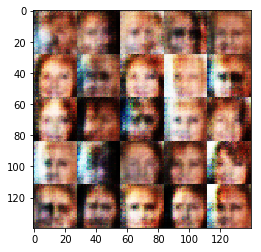

Epoch 2/10... Discriminator Loss: 1.4588... Generator Loss: 0.6779
Epoch 2/10... Discriminator Loss: 1.5006... Generator Loss: 0.7001
Epoch 2/10... Discriminator Loss: 1.4477... Generator Loss: 0.6964
Epoch 2/10... Discriminator Loss: 1.4899... Generator Loss: 0.7306
Epoch 2/10... Discriminator Loss: 1.4307... Generator Loss: 0.7506
Epoch 2/10... Discriminator Loss: 1.4034... Generator Loss: 0.7607
Epoch 2/10... Discriminator Loss: 1.4101... Generator Loss: 0.7333
Epoch 2/10... Discriminator Loss: 1.4177... Generator Loss: 0.7662
Epoch 2/10... Discriminator Loss: 1.4836... Generator Loss: 0.7114
Epoch 2/10... Discriminator Loss: 1.4021... Generator Loss: 0.6883


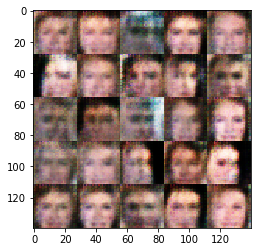

Epoch 2/10... Discriminator Loss: 1.5307... Generator Loss: 0.6397
Epoch 2/10... Discriminator Loss: 1.5124... Generator Loss: 0.7578
Epoch 2/10... Discriminator Loss: 1.4928... Generator Loss: 0.6898
Epoch 2/10... Discriminator Loss: 1.3786... Generator Loss: 0.7260
Epoch 2/10... Discriminator Loss: 1.5403... Generator Loss: 0.6866
Epoch 2/10... Discriminator Loss: 1.4133... Generator Loss: 0.7468
Epoch 2/10... Discriminator Loss: 1.4647... Generator Loss: 0.7645
Epoch 2/10... Discriminator Loss: 1.5300... Generator Loss: 0.6597
Epoch 2/10... Discriminator Loss: 1.4537... Generator Loss: 0.7642
Epoch 2/10... Discriminator Loss: 1.5356... Generator Loss: 0.7121


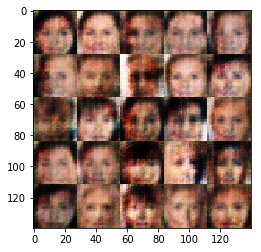

Epoch 2/10... Discriminator Loss: 1.5692... Generator Loss: 0.7291
Epoch 2/10... Discriminator Loss: 1.3878... Generator Loss: 0.7391
Epoch 2/10... Discriminator Loss: 1.4032... Generator Loss: 0.7094
Epoch 2/10... Discriminator Loss: 1.4793... Generator Loss: 0.7533
Epoch 2/10... Discriminator Loss: 1.4867... Generator Loss: 0.7061
Epoch 2/10... Discriminator Loss: 1.4475... Generator Loss: 0.6555
Epoch 2/10... Discriminator Loss: 1.4313... Generator Loss: 0.7654
Epoch 2/10... Discriminator Loss: 1.4929... Generator Loss: 0.8558
Epoch 2/10... Discriminator Loss: 1.3463... Generator Loss: 0.7971
Epoch 2/10... Discriminator Loss: 1.5026... Generator Loss: 0.7190


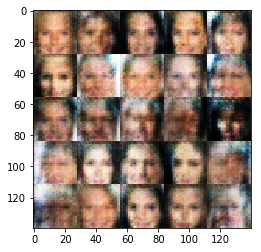

Epoch 2/10... Discriminator Loss: 1.4418... Generator Loss: 0.6985
Epoch 2/10... Discriminator Loss: 1.4619... Generator Loss: 0.7543
Epoch 2/10... Discriminator Loss: 1.4150... Generator Loss: 0.7289
Epoch 2/10... Discriminator Loss: 1.5051... Generator Loss: 0.6827
Epoch 2/10... Discriminator Loss: 1.4004... Generator Loss: 0.6971
Epoch 2/10... Discriminator Loss: 1.3831... Generator Loss: 0.7367
Epoch 2/10... Discriminator Loss: 1.4908... Generator Loss: 0.6762
Epoch 2/10... Discriminator Loss: 1.3705... Generator Loss: 0.7145
Epoch 2/10... Discriminator Loss: 1.3744... Generator Loss: 0.7684
Epoch 2/10... Discriminator Loss: 1.4312... Generator Loss: 0.7660


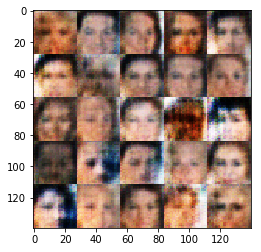

Epoch 2/10... Discriminator Loss: 1.5037... Generator Loss: 0.6676
Epoch 2/10... Discriminator Loss: 1.3462... Generator Loss: 0.8192
Epoch 2/10... Discriminator Loss: 1.4230... Generator Loss: 0.7480
Epoch 2/10... Discriminator Loss: 1.4770... Generator Loss: 0.6233
Epoch 2/10... Discriminator Loss: 1.4672... Generator Loss: 0.7034
Epoch 2/10... Discriminator Loss: 1.4819... Generator Loss: 0.7544
Epoch 2/10... Discriminator Loss: 1.5383... Generator Loss: 0.6853
Epoch 2/10... Discriminator Loss: 1.5268... Generator Loss: 0.7285
Epoch 2/10... Discriminator Loss: 1.4245... Generator Loss: 0.7162
Epoch 2/10... Discriminator Loss: 1.4589... Generator Loss: 0.6463


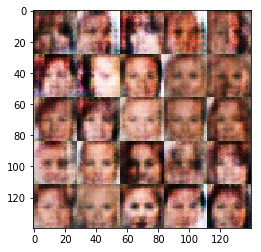

Epoch 2/10... Discriminator Loss: 1.4947... Generator Loss: 0.7284
Epoch 2/10... Discriminator Loss: 1.4630... Generator Loss: 0.7381
Epoch 2/10... Discriminator Loss: 1.4808... Generator Loss: 0.6762
Epoch 2/10... Discriminator Loss: 1.5038... Generator Loss: 0.7030
Epoch 2/10... Discriminator Loss: 1.4079... Generator Loss: 0.8154
Epoch 2/10... Discriminator Loss: 1.4004... Generator Loss: 0.7550
Epoch 2/10... Discriminator Loss: 1.4297... Generator Loss: 0.7949
Epoch 2/10... Discriminator Loss: 1.4438... Generator Loss: 0.7982
Epoch 2/10... Discriminator Loss: 1.4697... Generator Loss: 0.7306
Epoch 2/10... Discriminator Loss: 1.4409... Generator Loss: 0.7372


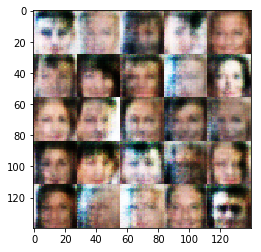

Epoch 2/10... Discriminator Loss: 1.4843... Generator Loss: 0.6995
Epoch 2/10... Discriminator Loss: 1.4381... Generator Loss: 0.7455
Epoch 2/10... Discriminator Loss: 1.4274... Generator Loss: 0.7667
Epoch 2/10... Discriminator Loss: 1.4100... Generator Loss: 0.7107
Epoch 2/10... Discriminator Loss: 1.4161... Generator Loss: 0.7460
Epoch 2/10... Discriminator Loss: 1.5012... Generator Loss: 0.7577
Epoch 2/10... Discriminator Loss: 1.4061... Generator Loss: 0.7759
Epoch 2/10... Discriminator Loss: 1.4200... Generator Loss: 0.7192
Epoch 2/10... Discriminator Loss: 1.4588... Generator Loss: 0.6486
Epoch 2/10... Discriminator Loss: 1.4444... Generator Loss: 0.7153


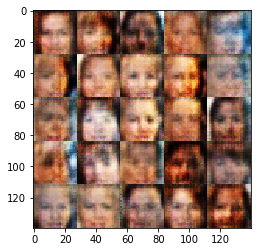

Epoch 2/10... Discriminator Loss: 1.3254... Generator Loss: 0.7913
Epoch 2/10... Discriminator Loss: 1.4477... Generator Loss: 0.6939
Epoch 2/10... Discriminator Loss: 1.4862... Generator Loss: 0.6956
Epoch 2/10... Discriminator Loss: 1.4121... Generator Loss: 0.7581
Epoch 2/10... Discriminator Loss: 1.4554... Generator Loss: 0.7070
Epoch 2/10... Discriminator Loss: 1.3682... Generator Loss: 0.7738
Epoch 2/10... Discriminator Loss: 1.4444... Generator Loss: 0.7436
Epoch 2/10... Discriminator Loss: 1.3888... Generator Loss: 0.7450
Epoch 2/10... Discriminator Loss: 1.4495... Generator Loss: 0.6987
Epoch 2/10... Discriminator Loss: 1.4986... Generator Loss: 0.7617


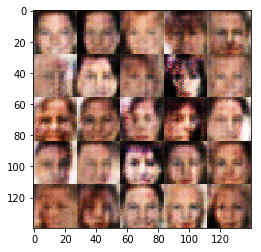

Epoch 2/10... Discriminator Loss: 1.4296... Generator Loss: 0.7030
Epoch 2/10... Discriminator Loss: 1.4328... Generator Loss: 0.7621
Epoch 2/10... Discriminator Loss: 1.4663... Generator Loss: 0.7746
Epoch 2/10... Discriminator Loss: 1.3779... Generator Loss: 0.7836
Epoch 2/10... Discriminator Loss: 1.4570... Generator Loss: 0.7356
Epoch 2/10... Discriminator Loss: 1.4169... Generator Loss: 0.7548
Epoch 2/10... Discriminator Loss: 1.4247... Generator Loss: 0.7239
Epoch 2/10... Discriminator Loss: 1.4356... Generator Loss: 0.7859
Epoch 2/10... Discriminator Loss: 1.4678... Generator Loss: 0.7200
Epoch 2/10... Discriminator Loss: 1.4114... Generator Loss: 0.7597


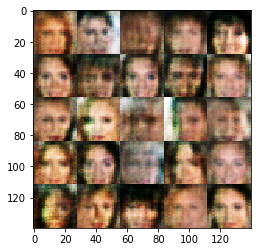

Epoch 2/10... Discriminator Loss: 1.4044... Generator Loss: 0.7389
Epoch 2/10... Discriminator Loss: 1.4154... Generator Loss: 0.7706
Epoch 2/10... Discriminator Loss: 1.4842... Generator Loss: 0.7098
Epoch 2/10... Discriminator Loss: 1.4536... Generator Loss: 0.7290
Epoch 2/10... Discriminator Loss: 1.3818... Generator Loss: 0.7929
Epoch 2/10... Discriminator Loss: 1.4873... Generator Loss: 0.7539
Epoch 2/10... Discriminator Loss: 1.3752... Generator Loss: 0.7461
Epoch 2/10... Discriminator Loss: 1.3763... Generator Loss: 0.8230
Epoch 2/10... Discriminator Loss: 1.4812... Generator Loss: 0.7671
Epoch 2/10... Discriminator Loss: 1.4190... Generator Loss: 0.6897


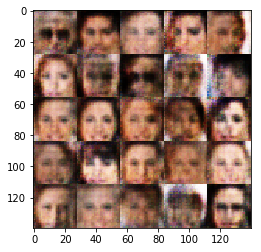

Epoch 2/10... Discriminator Loss: 1.4140... Generator Loss: 0.7495
Epoch 2/10... Discriminator Loss: 1.4123... Generator Loss: 0.7318
Epoch 2/10... Discriminator Loss: 1.4130... Generator Loss: 0.7075
Epoch 2/10... Discriminator Loss: 1.4288... Generator Loss: 0.7726
Epoch 2/10... Discriminator Loss: 1.4236... Generator Loss: 0.7502
Epoch 2/10... Discriminator Loss: 1.4830... Generator Loss: 0.7200
Epoch 2/10... Discriminator Loss: 1.4436... Generator Loss: 0.7316
Epoch 2/10... Discriminator Loss: 1.3835... Generator Loss: 0.7189
Epoch 2/10... Discriminator Loss: 1.4661... Generator Loss: 0.7664
Epoch 2/10... Discriminator Loss: 1.4594... Generator Loss: 0.6912


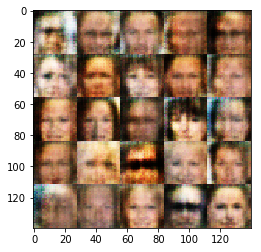

Epoch 2/10... Discriminator Loss: 1.5171... Generator Loss: 0.6844
Epoch 2/10... Discriminator Loss: 1.4154... Generator Loss: 0.7529
Epoch 2/10... Discriminator Loss: 1.4186... Generator Loss: 0.7101
Epoch 2/10... Discriminator Loss: 1.4575... Generator Loss: 0.7060
Epoch 2/10... Discriminator Loss: 1.3713... Generator Loss: 0.7070
Epoch 2/10... Discriminator Loss: 1.4081... Generator Loss: 0.7266
Epoch 2/10... Discriminator Loss: 1.4805... Generator Loss: 0.7160
Epoch 2/10... Discriminator Loss: 1.4134... Generator Loss: 0.7078
Epoch 2/10... Discriminator Loss: 1.4275... Generator Loss: 0.7469
Epoch 2/10... Discriminator Loss: 1.4402... Generator Loss: 0.7796


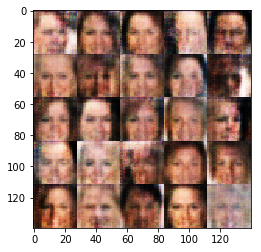

Epoch 2/10... Discriminator Loss: 1.4790... Generator Loss: 0.7288
Epoch 2/10... Discriminator Loss: 1.3745... Generator Loss: 0.7820
Epoch 2/10... Discriminator Loss: 1.4808... Generator Loss: 0.7267
Epoch 2/10... Discriminator Loss: 1.4682... Generator Loss: 0.7920
Epoch 2/10... Discriminator Loss: 1.4852... Generator Loss: 0.7484
Epoch 2/10... Discriminator Loss: 1.3660... Generator Loss: 0.8023
Epoch 2/10... Discriminator Loss: 1.3759... Generator Loss: 0.7031
Epoch 2/10... Discriminator Loss: 1.4294... Generator Loss: 0.7687
Epoch 2/10... Discriminator Loss: 1.4249... Generator Loss: 0.7130
Epoch 2/10... Discriminator Loss: 1.4158... Generator Loss: 0.7581


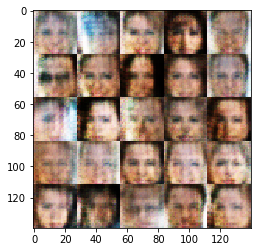

Epoch 2/10... Discriminator Loss: 1.4318... Generator Loss: 0.7481
Epoch 2/10... Discriminator Loss: 1.4066... Generator Loss: 0.7114
Epoch 2/10... Discriminator Loss: 1.4466... Generator Loss: 0.7193
Epoch 2/10... Discriminator Loss: 1.4039... Generator Loss: 0.7653
Epoch 2/10... Discriminator Loss: 1.4294... Generator Loss: 0.7271
Epoch 2/10... Discriminator Loss: 1.4757... Generator Loss: 0.7668
Epoch 2/10... Discriminator Loss: 1.3123... Generator Loss: 0.8071
Epoch 2/10... Discriminator Loss: 1.4794... Generator Loss: 0.7133
Epoch 2/10... Discriminator Loss: 1.4123... Generator Loss: 0.7875
Epoch 2/10... Discriminator Loss: 1.4921... Generator Loss: 0.7245


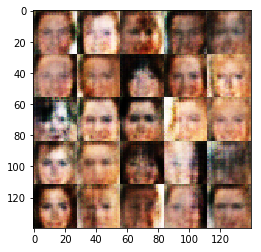

Epoch 2/10... Discriminator Loss: 1.4244... Generator Loss: 0.7106
Epoch 2/10... Discriminator Loss: 1.4553... Generator Loss: 0.7311
Epoch 2/10... Discriminator Loss: 1.3751... Generator Loss: 0.7646
Epoch 2/10... Discriminator Loss: 1.3790... Generator Loss: 0.7575
Epoch 2/10... Discriminator Loss: 1.4753... Generator Loss: 0.7554
Epoch 2/10... Discriminator Loss: 1.3800... Generator Loss: 0.8213
Epoch 2/10... Discriminator Loss: 1.4771... Generator Loss: 0.7534
Epoch 2/10... Discriminator Loss: 1.4912... Generator Loss: 0.7867
Epoch 2/10... Discriminator Loss: 1.4482... Generator Loss: 0.7426
Epoch 2/10... Discriminator Loss: 1.3881... Generator Loss: 0.7984


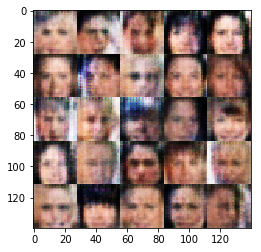

Epoch 2/10... Discriminator Loss: 1.4744... Generator Loss: 0.6869
Epoch 2/10... Discriminator Loss: 1.3763... Generator Loss: 0.7301
Epoch 2/10... Discriminator Loss: 1.4184... Generator Loss: 0.7860
Epoch 2/10... Discriminator Loss: 1.3724... Generator Loss: 0.7645
Epoch 2/10... Discriminator Loss: 1.4542... Generator Loss: 0.7493
Epoch 2/10... Discriminator Loss: 1.4258... Generator Loss: 0.7591
Epoch 2/10... Discriminator Loss: 1.5090... Generator Loss: 0.7317
Epoch 2/10... Discriminator Loss: 1.4695... Generator Loss: 0.6902
Epoch 2/10... Discriminator Loss: 1.4577... Generator Loss: 0.7286
Epoch 2/10... Discriminator Loss: 1.4359... Generator Loss: 0.7128


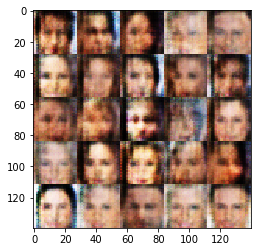

Epoch 2/10... Discriminator Loss: 1.4256... Generator Loss: 0.7394
Epoch 2/10... Discriminator Loss: 1.4611... Generator Loss: 0.7624
Epoch 2/10... Discriminator Loss: 1.4243... Generator Loss: 0.7379
Epoch 2/10... Discriminator Loss: 1.4820... Generator Loss: 0.7094
Epoch 2/10... Discriminator Loss: 1.4031... Generator Loss: 0.7293
Epoch 2/10... Discriminator Loss: 1.3809... Generator Loss: 0.7557
Epoch 2/10... Discriminator Loss: 1.4612... Generator Loss: 0.7389
Epoch 2/10... Discriminator Loss: 1.4259... Generator Loss: 0.7236
Epoch 2/10... Discriminator Loss: 1.3375... Generator Loss: 0.7513
Epoch 2/10... Discriminator Loss: 1.5053... Generator Loss: 0.6250


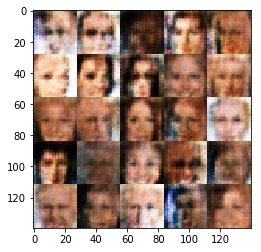

Epoch 2/10... Discriminator Loss: 1.4281... Generator Loss: 0.7544
Epoch 2/10... Discriminator Loss: 1.4608... Generator Loss: 0.7043
Epoch 2/10... Discriminator Loss: 1.4501... Generator Loss: 0.6861
Epoch 2/10... Discriminator Loss: 1.4825... Generator Loss: 0.7663
Epoch 2/10... Discriminator Loss: 1.3537... Generator Loss: 0.7198
Epoch 2/10... Discriminator Loss: 1.4178... Generator Loss: 0.7889
Epoch 2/10... Discriminator Loss: 1.4352... Generator Loss: 0.7810
Epoch 2/10... Discriminator Loss: 1.4540... Generator Loss: 0.7679
Epoch 2/10... Discriminator Loss: 1.3927... Generator Loss: 0.7948
Epoch 2/10... Discriminator Loss: 1.4325... Generator Loss: 0.7790


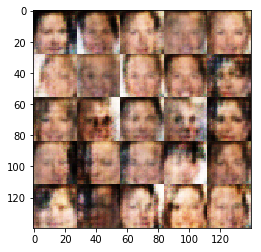

Epoch 2/10... Discriminator Loss: 1.4271... Generator Loss: 0.7315
Epoch 2/10... Discriminator Loss: 1.4252... Generator Loss: 0.7070
Epoch 2/10... Discriminator Loss: 1.4886... Generator Loss: 0.6982
Epoch 2/10... Discriminator Loss: 1.3935... Generator Loss: 0.7179
Epoch 2/10... Discriminator Loss: 1.3828... Generator Loss: 0.8523
Epoch 2/10... Discriminator Loss: 1.4272... Generator Loss: 0.7367
Epoch 2/10... Discriminator Loss: 1.4165... Generator Loss: 0.7055
Epoch 2/10... Discriminator Loss: 1.4043... Generator Loss: 0.7526
Epoch 2/10... Discriminator Loss: 1.4971... Generator Loss: 0.7516
Epoch 2/10... Discriminator Loss: 1.4466... Generator Loss: 0.7283


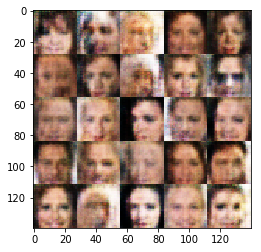

Epoch 2/10... Discriminator Loss: 1.4394... Generator Loss: 0.6958
Epoch 2/10... Discriminator Loss: 1.3558... Generator Loss: 0.7935
Epoch 2/10... Discriminator Loss: 1.4029... Generator Loss: 0.7314
Epoch 2/10... Discriminator Loss: 1.4837... Generator Loss: 0.7172
Epoch 2/10... Discriminator Loss: 1.4142... Generator Loss: 0.7687
Epoch 2/10... Discriminator Loss: 1.4416... Generator Loss: 0.7426
Epoch 2/10... Discriminator Loss: 1.4443... Generator Loss: 0.7237
Epoch 2/10... Discriminator Loss: 1.3894... Generator Loss: 0.8005
Epoch 2/10... Discriminator Loss: 1.4712... Generator Loss: 0.7462
Epoch 2/10... Discriminator Loss: 1.4333... Generator Loss: 0.7453


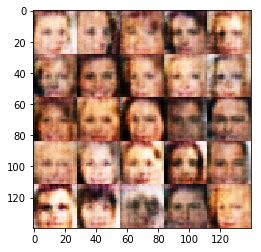

Epoch 2/10... Discriminator Loss: 1.4397... Generator Loss: 0.7351
Epoch 2/10... Discriminator Loss: 1.3863... Generator Loss: 0.7294
Epoch 2/10... Discriminator Loss: 1.4871... Generator Loss: 0.7498
Epoch 2/10... Discriminator Loss: 1.4278... Generator Loss: 0.7157
Epoch 2/10... Discriminator Loss: 1.3864... Generator Loss: 0.7655
Epoch 2/10... Discriminator Loss: 1.4610... Generator Loss: 0.7015
Epoch 2/10... Discriminator Loss: 1.4062... Generator Loss: 0.6897
Epoch 2/10... Discriminator Loss: 1.4190... Generator Loss: 0.7210
Epoch 2/10... Discriminator Loss: 1.3834... Generator Loss: 0.7610
Epoch 2/10... Discriminator Loss: 1.4263... Generator Loss: 0.8075


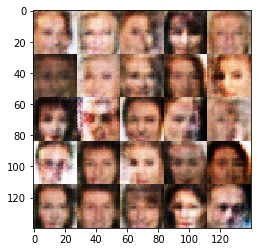

Epoch 2/10... Discriminator Loss: 1.4554... Generator Loss: 0.7048
Epoch 2/10... Discriminator Loss: 1.3689... Generator Loss: 0.7925
Epoch 2/10... Discriminator Loss: 1.3796... Generator Loss: 0.7645
Epoch 2/10... Discriminator Loss: 1.4289... Generator Loss: 0.7514
Epoch 2/10... Discriminator Loss: 1.3703... Generator Loss: 0.7581
Epoch 2/10... Discriminator Loss: 1.3846... Generator Loss: 0.7196
Epoch 2/10... Discriminator Loss: 1.3909... Generator Loss: 0.7734
Epoch 2/10... Discriminator Loss: 1.4134... Generator Loss: 0.7915
Epoch 2/10... Discriminator Loss: 1.4250... Generator Loss: 0.7352
Epoch 2/10... Discriminator Loss: 1.4138... Generator Loss: 0.7817


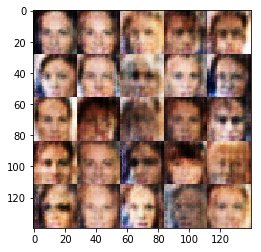

Epoch 2/10... Discriminator Loss: 1.4379... Generator Loss: 0.7445
Epoch 2/10... Discriminator Loss: 1.4785... Generator Loss: 0.7179
Epoch 2/10... Discriminator Loss: 1.3965... Generator Loss: 0.7831
Epoch 2/10... Discriminator Loss: 1.3991... Generator Loss: 0.7221
Epoch 2/10... Discriminator Loss: 1.3569... Generator Loss: 0.7975
Epoch 2/10... Discriminator Loss: 1.5359... Generator Loss: 0.7023
Epoch 2/10... Discriminator Loss: 1.4501... Generator Loss: 0.7279
Epoch 2/10... Discriminator Loss: 1.4256... Generator Loss: 0.6995
Epoch 2/10... Discriminator Loss: 1.4407... Generator Loss: 0.7491
Epoch 2/10... Discriminator Loss: 1.3532... Generator Loss: 0.7725


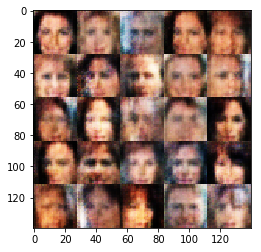

Epoch 2/10... Discriminator Loss: 1.3773... Generator Loss: 0.7827
Epoch 2/10... Discriminator Loss: 1.4607... Generator Loss: 0.7206
Epoch 2/10... Discriminator Loss: 1.4245... Generator Loss: 0.7745
Epoch 2/10... Discriminator Loss: 1.3895... Generator Loss: 0.7567
Epoch 2/10... Discriminator Loss: 1.3772... Generator Loss: 0.7701
Epoch 2/10... Discriminator Loss: 1.4234... Generator Loss: 0.7776
Epoch 2/10... Discriminator Loss: 1.4328... Generator Loss: 0.7245
Epoch 2/10... Discriminator Loss: 1.4244... Generator Loss: 0.7061
Epoch 2/10... Discriminator Loss: 1.4222... Generator Loss: 0.7162
Epoch 2/10... Discriminator Loss: 1.4521... Generator Loss: 0.6947


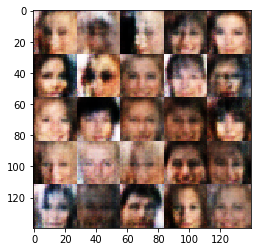

Epoch 2/10... Discriminator Loss: 1.4336... Generator Loss: 0.7455
Epoch 2/10... Discriminator Loss: 1.3818... Generator Loss: 0.7339
Epoch 2/10... Discriminator Loss: 1.4079... Generator Loss: 0.8045
Epoch 2/10... Discriminator Loss: 1.5063... Generator Loss: 0.6909
Epoch 2/10... Discriminator Loss: 1.4056... Generator Loss: 0.7466
Epoch 2/10... Discriminator Loss: 1.3871... Generator Loss: 0.7859
Epoch 2/10... Discriminator Loss: 1.3481... Generator Loss: 0.8426
Epoch 2/10... Discriminator Loss: 1.3670... Generator Loss: 0.7783
Epoch 2/10... Discriminator Loss: 1.4162... Generator Loss: 0.7759
Epoch 2/10... Discriminator Loss: 1.4125... Generator Loss: 0.7336


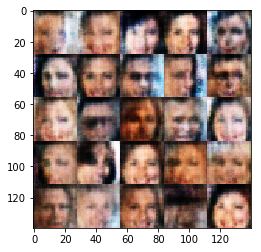

Epoch 2/10... Discriminator Loss: 1.3876... Generator Loss: 0.7387
Epoch 2/10... Discriminator Loss: 1.4586... Generator Loss: 0.7569
Epoch 2/10... Discriminator Loss: 1.4029... Generator Loss: 0.7479
Epoch 2/10... Discriminator Loss: 1.3823... Generator Loss: 0.7452
Epoch 2/10... Discriminator Loss: 1.4232... Generator Loss: 0.8065
Epoch 2/10... Discriminator Loss: 1.5153... Generator Loss: 0.7066
Epoch 2/10... Discriminator Loss: 1.4824... Generator Loss: 0.7102
Epoch 2/10... Discriminator Loss: 1.4850... Generator Loss: 0.6926
Epoch 2/10... Discriminator Loss: 1.4639... Generator Loss: 0.7556
Epoch 2/10... Discriminator Loss: 1.3837... Generator Loss: 0.7096


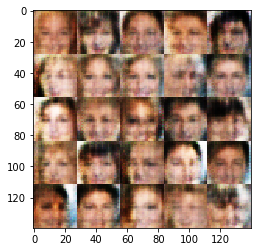

Epoch 2/10... Discriminator Loss: 1.4334... Generator Loss: 0.7416
Epoch 2/10... Discriminator Loss: 1.4756... Generator Loss: 0.6939
Epoch 2/10... Discriminator Loss: 1.3688... Generator Loss: 0.7512
Epoch 2/10... Discriminator Loss: 1.4702... Generator Loss: 0.7142
Epoch 2/10... Discriminator Loss: 1.4278... Generator Loss: 0.7539
Epoch 2/10... Discriminator Loss: 1.4382... Generator Loss: 0.7376
Epoch 2/10... Discriminator Loss: 1.4883... Generator Loss: 0.6951
Epoch 2/10... Discriminator Loss: 1.4281... Generator Loss: 0.6788
Epoch 2/10... Discriminator Loss: 1.4459... Generator Loss: 0.7129
Epoch 2/10... Discriminator Loss: 1.4229... Generator Loss: 0.7947


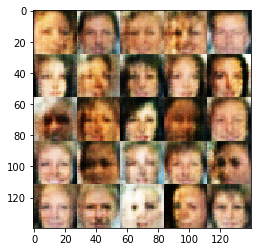

Epoch 2/10... Discriminator Loss: 1.4343... Generator Loss: 0.6560
Epoch 2/10... Discriminator Loss: 1.4819... Generator Loss: 0.6940
Epoch 2/10... Discriminator Loss: 1.3760... Generator Loss: 0.7521
Epoch 2/10... Discriminator Loss: 1.4290... Generator Loss: 0.7322
Epoch 2/10... Discriminator Loss: 1.4115... Generator Loss: 0.7496
Epoch 2/10... Discriminator Loss: 1.4339... Generator Loss: 0.7881
Epoch 2/10... Discriminator Loss: 1.4178... Generator Loss: 0.7306
Epoch 2/10... Discriminator Loss: 1.4390... Generator Loss: 0.7788
Epoch 2/10... Discriminator Loss: 1.3308... Generator Loss: 0.8106
Epoch 2/10... Discriminator Loss: 1.4404... Generator Loss: 0.7692


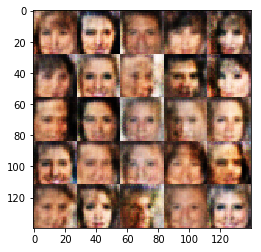

Epoch 2/10... Discriminator Loss: 1.4166... Generator Loss: 0.7375
Epoch 2/10... Discriminator Loss: 1.4530... Generator Loss: 0.7255
Epoch 2/10... Discriminator Loss: 1.4733... Generator Loss: 0.7374
Epoch 2/10... Discriminator Loss: 1.3855... Generator Loss: 0.7983
Epoch 2/10... Discriminator Loss: 1.3004... Generator Loss: 0.7747
Epoch 2/10... Discriminator Loss: 1.3825... Generator Loss: 0.7889
Epoch 2/10... Discriminator Loss: 1.4290... Generator Loss: 0.7338
Epoch 2/10... Discriminator Loss: 1.3744... Generator Loss: 0.7467
Epoch 2/10... Discriminator Loss: 1.4005... Generator Loss: 0.7483
Epoch 2/10... Discriminator Loss: 1.3380... Generator Loss: 0.7443


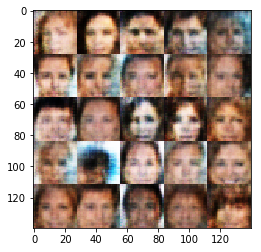

Epoch 2/10... Discriminator Loss: 1.4741... Generator Loss: 0.7153
Epoch 2/10... Discriminator Loss: 1.4334... Generator Loss: 0.7082
Epoch 2/10... Discriminator Loss: 1.3651... Generator Loss: 0.7898
Epoch 2/10... Discriminator Loss: 1.4246... Generator Loss: 0.7413
Epoch 2/10... Discriminator Loss: 1.4099... Generator Loss: 0.7481
Epoch 2/10... Discriminator Loss: 1.4061... Generator Loss: 0.7604
Epoch 2/10... Discriminator Loss: 1.4691... Generator Loss: 0.7858
Epoch 2/10... Discriminator Loss: 1.3844... Generator Loss: 0.7668
Epoch 2/10... Discriminator Loss: 1.4410... Generator Loss: 0.7391
Epoch 2/10... Discriminator Loss: 1.4312... Generator Loss: 0.7414


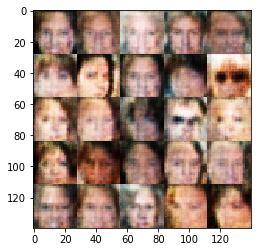

Epoch 2/10... Discriminator Loss: 1.4612... Generator Loss: 0.7491
Epoch 2/10... Discriminator Loss: 1.4162... Generator Loss: 0.7550
Epoch 2/10... Discriminator Loss: 1.4678... Generator Loss: 0.7963
Epoch 3/10... Discriminator Loss: 1.4254... Generator Loss: 0.7876
Epoch 3/10... Discriminator Loss: 1.4190... Generator Loss: 0.7307
Epoch 3/10... Discriminator Loss: 1.4016... Generator Loss: 0.7781
Epoch 3/10... Discriminator Loss: 1.4175... Generator Loss: 0.7952
Epoch 3/10... Discriminator Loss: 1.4602... Generator Loss: 0.6992
Epoch 3/10... Discriminator Loss: 1.4422... Generator Loss: 0.7919
Epoch 3/10... Discriminator Loss: 1.4097... Generator Loss: 0.7201


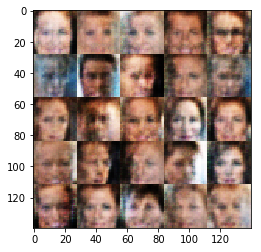

Epoch 3/10... Discriminator Loss: 1.4233... Generator Loss: 0.7165
Epoch 3/10... Discriminator Loss: 1.3913... Generator Loss: 0.7443
Epoch 3/10... Discriminator Loss: 1.4472... Generator Loss: 0.6971
Epoch 3/10... Discriminator Loss: 1.3982... Generator Loss: 0.7579
Epoch 3/10... Discriminator Loss: 1.4778... Generator Loss: 0.7166
Epoch 3/10... Discriminator Loss: 1.4573... Generator Loss: 0.7773
Epoch 3/10... Discriminator Loss: 1.5052... Generator Loss: 0.7198
Epoch 3/10... Discriminator Loss: 1.4185... Generator Loss: 0.7094
Epoch 3/10... Discriminator Loss: 1.4089... Generator Loss: 0.7005
Epoch 3/10... Discriminator Loss: 1.4129... Generator Loss: 0.7627


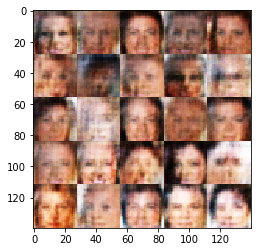

Epoch 3/10... Discriminator Loss: 1.3872... Generator Loss: 0.6970
Epoch 3/10... Discriminator Loss: 1.4515... Generator Loss: 0.7312
Epoch 3/10... Discriminator Loss: 1.4423... Generator Loss: 0.7296
Epoch 3/10... Discriminator Loss: 1.4575... Generator Loss: 0.7168
Epoch 3/10... Discriminator Loss: 1.4539... Generator Loss: 0.7344
Epoch 3/10... Discriminator Loss: 1.3855... Generator Loss: 0.7430
Epoch 3/10... Discriminator Loss: 1.3803... Generator Loss: 0.7276
Epoch 3/10... Discriminator Loss: 1.4502... Generator Loss: 0.6747
Epoch 3/10... Discriminator Loss: 1.4255... Generator Loss: 0.7976
Epoch 3/10... Discriminator Loss: 1.3803... Generator Loss: 0.7851


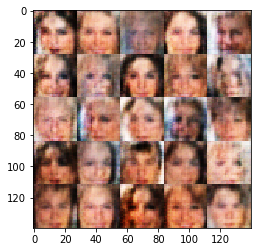

Epoch 3/10... Discriminator Loss: 1.3996... Generator Loss: 0.7723
Epoch 3/10... Discriminator Loss: 1.4358... Generator Loss: 0.7287
Epoch 3/10... Discriminator Loss: 1.4602... Generator Loss: 0.6979
Epoch 3/10... Discriminator Loss: 1.3988... Generator Loss: 0.7896
Epoch 3/10... Discriminator Loss: 1.3792... Generator Loss: 0.7658
Epoch 3/10... Discriminator Loss: 1.4188... Generator Loss: 0.7166
Epoch 3/10... Discriminator Loss: 1.3701... Generator Loss: 0.7853
Epoch 3/10... Discriminator Loss: 1.4675... Generator Loss: 0.7583
Epoch 3/10... Discriminator Loss: 1.4394... Generator Loss: 0.7551
Epoch 3/10... Discriminator Loss: 1.4424... Generator Loss: 0.7098


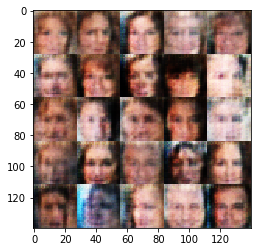

Epoch 3/10... Discriminator Loss: 1.4242... Generator Loss: 0.7571
Epoch 3/10... Discriminator Loss: 1.3934... Generator Loss: 0.7500
Epoch 3/10... Discriminator Loss: 1.4428... Generator Loss: 0.7708
Epoch 3/10... Discriminator Loss: 1.4766... Generator Loss: 0.7380
Epoch 3/10... Discriminator Loss: 1.4491... Generator Loss: 0.7366
Epoch 3/10... Discriminator Loss: 1.4316... Generator Loss: 0.7490
Epoch 3/10... Discriminator Loss: 1.3997... Generator Loss: 0.7811
Epoch 3/10... Discriminator Loss: 1.4170... Generator Loss: 0.7308
Epoch 3/10... Discriminator Loss: 1.4494... Generator Loss: 0.7800
Epoch 3/10... Discriminator Loss: 1.4422... Generator Loss: 0.7444


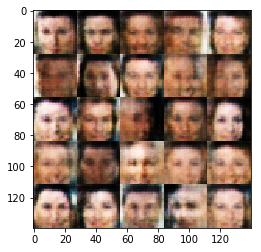

Epoch 3/10... Discriminator Loss: 1.4229... Generator Loss: 0.7471
Epoch 3/10... Discriminator Loss: 1.4324... Generator Loss: 0.7634
Epoch 3/10... Discriminator Loss: 1.3962... Generator Loss: 0.7204
Epoch 3/10... Discriminator Loss: 1.4851... Generator Loss: 0.7584
Epoch 3/10... Discriminator Loss: 1.3953... Generator Loss: 0.7446
Epoch 3/10... Discriminator Loss: 1.4297... Generator Loss: 0.7311
Epoch 3/10... Discriminator Loss: 1.5189... Generator Loss: 0.6892
Epoch 3/10... Discriminator Loss: 1.3643... Generator Loss: 0.7336
Epoch 3/10... Discriminator Loss: 1.4100... Generator Loss: 0.7208
Epoch 3/10... Discriminator Loss: 1.4458... Generator Loss: 0.7522


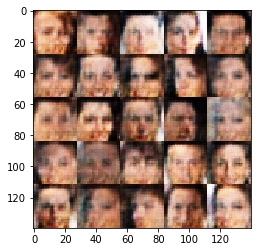

Epoch 3/10... Discriminator Loss: 1.4602... Generator Loss: 0.7466
Epoch 3/10... Discriminator Loss: 1.4425... Generator Loss: 0.7806
Epoch 3/10... Discriminator Loss: 1.4542... Generator Loss: 0.7373
Epoch 3/10... Discriminator Loss: 1.4502... Generator Loss: 0.6956
Epoch 3/10... Discriminator Loss: 1.4334... Generator Loss: 0.7878
Epoch 3/10... Discriminator Loss: 1.4359... Generator Loss: 0.7300
Epoch 3/10... Discriminator Loss: 1.4002... Generator Loss: 0.7228
Epoch 3/10... Discriminator Loss: 1.4428... Generator Loss: 0.7583
Epoch 3/10... Discriminator Loss: 1.4371... Generator Loss: 0.7608
Epoch 3/10... Discriminator Loss: 1.3722... Generator Loss: 0.7659


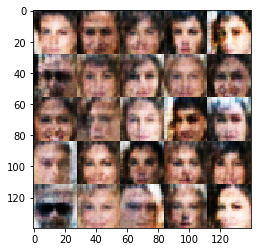

Epoch 3/10... Discriminator Loss: 1.4652... Generator Loss: 0.7325
Epoch 3/10... Discriminator Loss: 1.4154... Generator Loss: 0.7354
Epoch 3/10... Discriminator Loss: 1.5004... Generator Loss: 0.7483
Epoch 3/10... Discriminator Loss: 1.4144... Generator Loss: 0.7429
Epoch 3/10... Discriminator Loss: 1.4260... Generator Loss: 0.7440
Epoch 3/10... Discriminator Loss: 1.4356... Generator Loss: 0.7598
Epoch 3/10... Discriminator Loss: 1.4248... Generator Loss: 0.7268
Epoch 3/10... Discriminator Loss: 1.4301... Generator Loss: 0.7653
Epoch 3/10... Discriminator Loss: 1.3837... Generator Loss: 0.7811
Epoch 3/10... Discriminator Loss: 1.4081... Generator Loss: 0.7656


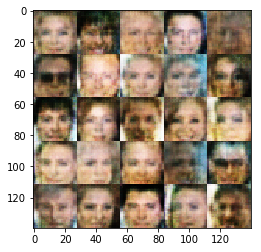

Epoch 3/10... Discriminator Loss: 1.4813... Generator Loss: 0.7094
Epoch 3/10... Discriminator Loss: 1.4286... Generator Loss: 0.7407
Epoch 3/10... Discriminator Loss: 1.4148... Generator Loss: 0.7364
Epoch 3/10... Discriminator Loss: 1.3992... Generator Loss: 0.7629
Epoch 3/10... Discriminator Loss: 1.4037... Generator Loss: 0.7390
Epoch 3/10... Discriminator Loss: 1.4135... Generator Loss: 0.7419
Epoch 3/10... Discriminator Loss: 1.4354... Generator Loss: 0.7171
Epoch 3/10... Discriminator Loss: 1.4654... Generator Loss: 0.6853
Epoch 3/10... Discriminator Loss: 1.4432... Generator Loss: 0.7320
Epoch 3/10... Discriminator Loss: 1.4206... Generator Loss: 0.7308


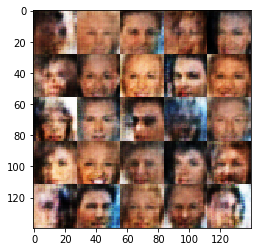

Epoch 3/10... Discriminator Loss: 1.4202... Generator Loss: 0.7817
Epoch 3/10... Discriminator Loss: 1.4432... Generator Loss: 0.7726
Epoch 3/10... Discriminator Loss: 1.4353... Generator Loss: 0.7294
Epoch 3/10... Discriminator Loss: 1.3614... Generator Loss: 0.7465
Epoch 3/10... Discriminator Loss: 1.3896... Generator Loss: 0.7621
Epoch 3/10... Discriminator Loss: 1.3525... Generator Loss: 0.7299
Epoch 3/10... Discriminator Loss: 1.3949... Generator Loss: 0.7967
Epoch 3/10... Discriminator Loss: 1.3835... Generator Loss: 0.7332
Epoch 3/10... Discriminator Loss: 1.4659... Generator Loss: 0.7540
Epoch 3/10... Discriminator Loss: 1.4233... Generator Loss: 0.6969


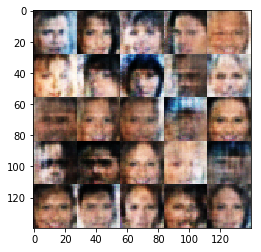

Epoch 3/10... Discriminator Loss: 1.3931... Generator Loss: 0.7437
Epoch 3/10... Discriminator Loss: 1.3979... Generator Loss: 0.7521
Epoch 3/10... Discriminator Loss: 1.3969... Generator Loss: 0.7913
Epoch 3/10... Discriminator Loss: 1.3922... Generator Loss: 0.7846
Epoch 3/10... Discriminator Loss: 1.4055... Generator Loss: 0.7736
Epoch 3/10... Discriminator Loss: 1.3976... Generator Loss: 0.7552
Epoch 3/10... Discriminator Loss: 1.3851... Generator Loss: 0.7896
Epoch 3/10... Discriminator Loss: 1.4631... Generator Loss: 0.7403
Epoch 3/10... Discriminator Loss: 1.4292... Generator Loss: 0.7901
Epoch 3/10... Discriminator Loss: 1.3512... Generator Loss: 0.7768


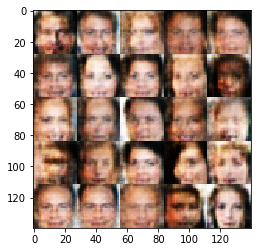

Epoch 3/10... Discriminator Loss: 1.3678... Generator Loss: 0.7674
Epoch 3/10... Discriminator Loss: 1.4337... Generator Loss: 0.7505
Epoch 3/10... Discriminator Loss: 1.3961... Generator Loss: 0.7444
Epoch 3/10... Discriminator Loss: 1.3492... Generator Loss: 0.7721
Epoch 3/10... Discriminator Loss: 1.3803... Generator Loss: 0.7639
Epoch 3/10... Discriminator Loss: 1.4135... Generator Loss: 0.7190
Epoch 3/10... Discriminator Loss: 1.4036... Generator Loss: 0.7564
Epoch 3/10... Discriminator Loss: 1.3812... Generator Loss: 0.7638
Epoch 3/10... Discriminator Loss: 1.4082... Generator Loss: 0.7349
Epoch 3/10... Discriminator Loss: 1.4469... Generator Loss: 0.7669


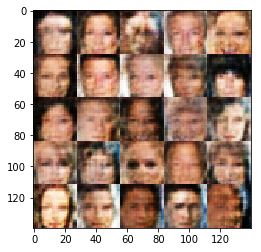

Epoch 3/10... Discriminator Loss: 1.3805... Generator Loss: 0.7860
Epoch 3/10... Discriminator Loss: 1.4630... Generator Loss: 0.7111
Epoch 3/10... Discriminator Loss: 1.4525... Generator Loss: 0.7190
Epoch 3/10... Discriminator Loss: 1.4442... Generator Loss: 0.7167
Epoch 3/10... Discriminator Loss: 1.4663... Generator Loss: 0.7468
Epoch 3/10... Discriminator Loss: 1.4354... Generator Loss: 0.7586
Epoch 3/10... Discriminator Loss: 1.4221... Generator Loss: 0.7162
Epoch 3/10... Discriminator Loss: 1.4143... Generator Loss: 0.7588
Epoch 3/10... Discriminator Loss: 1.4310... Generator Loss: 0.7526
Epoch 3/10... Discriminator Loss: 1.3906... Generator Loss: 0.7479


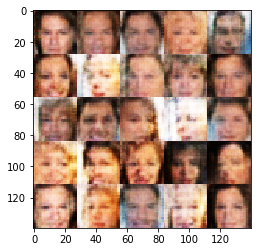

Epoch 3/10... Discriminator Loss: 1.4011... Generator Loss: 0.7598
Epoch 3/10... Discriminator Loss: 1.4348... Generator Loss: 0.6879
Epoch 3/10... Discriminator Loss: 1.4009... Generator Loss: 0.7404
Epoch 3/10... Discriminator Loss: 1.4509... Generator Loss: 0.6988
Epoch 3/10... Discriminator Loss: 1.4017... Generator Loss: 0.7182
Epoch 3/10... Discriminator Loss: 1.4626... Generator Loss: 0.7615
Epoch 3/10... Discriminator Loss: 1.4105... Generator Loss: 0.7610
Epoch 3/10... Discriminator Loss: 1.3914... Generator Loss: 0.7467
Epoch 3/10... Discriminator Loss: 1.4166... Generator Loss: 0.7291
Epoch 3/10... Discriminator Loss: 1.4259... Generator Loss: 0.7411


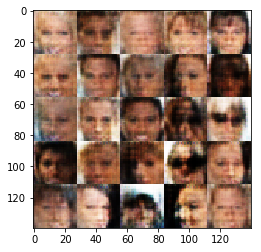

Epoch 3/10... Discriminator Loss: 1.4061... Generator Loss: 0.8263
Epoch 3/10... Discriminator Loss: 1.4144... Generator Loss: 0.7470
Epoch 3/10... Discriminator Loss: 1.4891... Generator Loss: 0.7300
Epoch 3/10... Discriminator Loss: 1.4073... Generator Loss: 0.7878
Epoch 3/10... Discriminator Loss: 1.3575... Generator Loss: 0.7226
Epoch 3/10... Discriminator Loss: 1.4160... Generator Loss: 0.7729
Epoch 3/10... Discriminator Loss: 1.4836... Generator Loss: 0.7307
Epoch 3/10... Discriminator Loss: 1.4165... Generator Loss: 0.7378
Epoch 3/10... Discriminator Loss: 1.4360... Generator Loss: 0.7499
Epoch 3/10... Discriminator Loss: 1.4507... Generator Loss: 0.7985


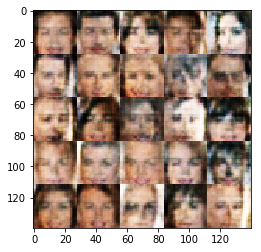

Epoch 3/10... Discriminator Loss: 1.3807... Generator Loss: 0.7574
Epoch 3/10... Discriminator Loss: 1.4075... Generator Loss: 0.8216
Epoch 3/10... Discriminator Loss: 1.4160... Generator Loss: 0.7482
Epoch 3/10... Discriminator Loss: 1.3944... Generator Loss: 0.7737
Epoch 3/10... Discriminator Loss: 1.3969... Generator Loss: 0.7376
Epoch 3/10... Discriminator Loss: 1.4347... Generator Loss: 0.7525
Epoch 3/10... Discriminator Loss: 1.3975... Generator Loss: 0.7326
Epoch 3/10... Discriminator Loss: 1.4554... Generator Loss: 0.7655
Epoch 3/10... Discriminator Loss: 1.4573... Generator Loss: 0.7543
Epoch 3/10... Discriminator Loss: 1.4083... Generator Loss: 0.7389


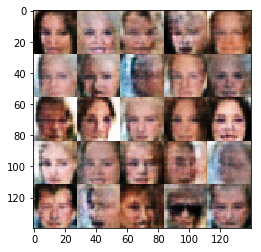

Epoch 3/10... Discriminator Loss: 1.3851... Generator Loss: 0.7751
Epoch 3/10... Discriminator Loss: 1.4518... Generator Loss: 0.7322
Epoch 3/10... Discriminator Loss: 1.4804... Generator Loss: 0.7459
Epoch 3/10... Discriminator Loss: 1.4532... Generator Loss: 0.7384
Epoch 3/10... Discriminator Loss: 1.4143... Generator Loss: 0.7918
Epoch 3/10... Discriminator Loss: 1.4489... Generator Loss: 0.7511
Epoch 3/10... Discriminator Loss: 1.4445... Generator Loss: 0.7251
Epoch 3/10... Discriminator Loss: 1.4355... Generator Loss: 0.7380
Epoch 3/10... Discriminator Loss: 1.3568... Generator Loss: 0.7499
Epoch 3/10... Discriminator Loss: 1.4589... Generator Loss: 0.7371


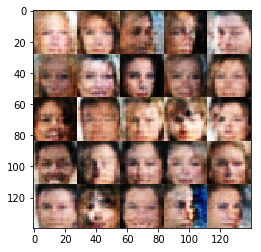

Epoch 3/10... Discriminator Loss: 1.4596... Generator Loss: 0.7165
Epoch 3/10... Discriminator Loss: 1.4956... Generator Loss: 0.7118
Epoch 3/10... Discriminator Loss: 1.5145... Generator Loss: 0.6535
Epoch 3/10... Discriminator Loss: 1.4428... Generator Loss: 0.7744
Epoch 3/10... Discriminator Loss: 1.4257... Generator Loss: 0.7503
Epoch 3/10... Discriminator Loss: 1.4233... Generator Loss: 0.7190
Epoch 3/10... Discriminator Loss: 1.4246... Generator Loss: 0.7753
Epoch 3/10... Discriminator Loss: 1.4439... Generator Loss: 0.7139
Epoch 3/10... Discriminator Loss: 1.4380... Generator Loss: 0.7141
Epoch 3/10... Discriminator Loss: 1.3866... Generator Loss: 0.7304


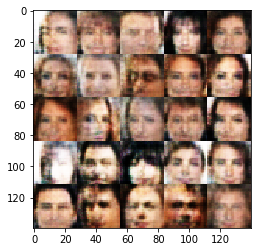

Epoch 3/10... Discriminator Loss: 1.4813... Generator Loss: 0.7175
Epoch 3/10... Discriminator Loss: 1.3759... Generator Loss: 0.7930
Epoch 3/10... Discriminator Loss: 1.4339... Generator Loss: 0.7191
Epoch 3/10... Discriminator Loss: 1.5283... Generator Loss: 0.7869
Epoch 3/10... Discriminator Loss: 1.4465... Generator Loss: 0.7236
Epoch 3/10... Discriminator Loss: 1.3982... Generator Loss: 0.7202
Epoch 3/10... Discriminator Loss: 1.4779... Generator Loss: 0.6704
Epoch 3/10... Discriminator Loss: 1.3830... Generator Loss: 0.7755
Epoch 3/10... Discriminator Loss: 1.4338... Generator Loss: 0.6957
Epoch 3/10... Discriminator Loss: 1.3356... Generator Loss: 0.7980


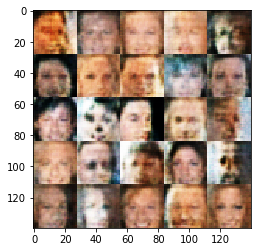

Epoch 3/10... Discriminator Loss: 1.4920... Generator Loss: 0.7337
Epoch 3/10... Discriminator Loss: 1.4555... Generator Loss: 0.6812
Epoch 3/10... Discriminator Loss: 1.4311... Generator Loss: 0.6891
Epoch 3/10... Discriminator Loss: 1.4442... Generator Loss: 0.7217
Epoch 3/10... Discriminator Loss: 1.4074... Generator Loss: 0.7245
Epoch 3/10... Discriminator Loss: 1.4180... Generator Loss: 0.7248
Epoch 3/10... Discriminator Loss: 1.4650... Generator Loss: 0.7354
Epoch 3/10... Discriminator Loss: 1.4902... Generator Loss: 0.7474
Epoch 3/10... Discriminator Loss: 1.5108... Generator Loss: 0.6982
Epoch 3/10... Discriminator Loss: 1.4288... Generator Loss: 0.7290


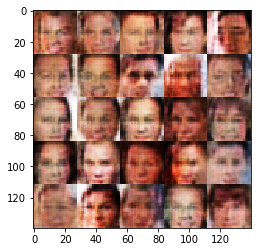

Epoch 3/10... Discriminator Loss: 1.3665... Generator Loss: 0.7924
Epoch 3/10... Discriminator Loss: 1.4428... Generator Loss: 0.7079
Epoch 3/10... Discriminator Loss: 1.4125... Generator Loss: 0.7752
Epoch 3/10... Discriminator Loss: 1.4064... Generator Loss: 0.7659
Epoch 3/10... Discriminator Loss: 1.4420... Generator Loss: 0.7584
Epoch 3/10... Discriminator Loss: 1.3654... Generator Loss: 0.7352
Epoch 3/10... Discriminator Loss: 1.3955... Generator Loss: 0.7437
Epoch 3/10... Discriminator Loss: 1.4066... Generator Loss: 0.7661
Epoch 3/10... Discriminator Loss: 1.3751... Generator Loss: 0.7318
Epoch 3/10... Discriminator Loss: 1.4490... Generator Loss: 0.7192


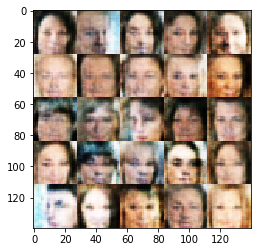

Epoch 3/10... Discriminator Loss: 1.4412... Generator Loss: 0.6998
Epoch 3/10... Discriminator Loss: 1.4427... Generator Loss: 0.7342
Epoch 3/10... Discriminator Loss: 1.4297... Generator Loss: 0.7135
Epoch 3/10... Discriminator Loss: 1.3688... Generator Loss: 0.7743
Epoch 3/10... Discriminator Loss: 1.4296... Generator Loss: 0.7266
Epoch 3/10... Discriminator Loss: 1.4787... Generator Loss: 0.7336
Epoch 3/10... Discriminator Loss: 1.4128... Generator Loss: 0.7211
Epoch 3/10... Discriminator Loss: 1.4745... Generator Loss: 0.7113
Epoch 3/10... Discriminator Loss: 1.4164... Generator Loss: 0.6928
Epoch 3/10... Discriminator Loss: 1.4233... Generator Loss: 0.7258


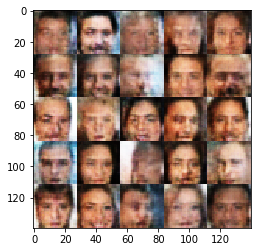

Epoch 3/10... Discriminator Loss: 1.3585... Generator Loss: 0.7797
Epoch 3/10... Discriminator Loss: 1.4129... Generator Loss: 0.6968
Epoch 3/10... Discriminator Loss: 1.4730... Generator Loss: 0.6863
Epoch 3/10... Discriminator Loss: 1.4301... Generator Loss: 0.7321
Epoch 3/10... Discriminator Loss: 1.4066... Generator Loss: 0.7204
Epoch 3/10... Discriminator Loss: 1.4192... Generator Loss: 0.7252
Epoch 3/10... Discriminator Loss: 1.3647... Generator Loss: 0.7111
Epoch 3/10... Discriminator Loss: 1.4521... Generator Loss: 0.6736
Epoch 3/10... Discriminator Loss: 1.3713... Generator Loss: 0.7658
Epoch 3/10... Discriminator Loss: 1.3748... Generator Loss: 0.7426


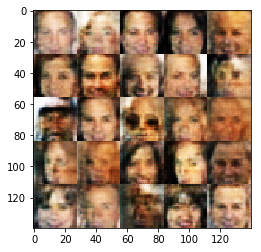

Epoch 3/10... Discriminator Loss: 1.4103... Generator Loss: 0.7741
Epoch 3/10... Discriminator Loss: 1.4363... Generator Loss: 0.7478
Epoch 3/10... Discriminator Loss: 1.4859... Generator Loss: 0.6975
Epoch 3/10... Discriminator Loss: 1.4313... Generator Loss: 0.7423
Epoch 3/10... Discriminator Loss: 1.4698... Generator Loss: 0.7382
Epoch 3/10... Discriminator Loss: 1.3989... Generator Loss: 0.7605
Epoch 3/10... Discriminator Loss: 1.4610... Generator Loss: 0.7484
Epoch 3/10... Discriminator Loss: 1.3894... Generator Loss: 0.7487
Epoch 3/10... Discriminator Loss: 1.4011... Generator Loss: 0.7295
Epoch 3/10... Discriminator Loss: 1.3653... Generator Loss: 0.8109


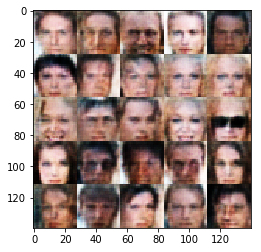

Epoch 3/10... Discriminator Loss: 1.4409... Generator Loss: 0.7731
Epoch 3/10... Discriminator Loss: 1.4266... Generator Loss: 0.7545
Epoch 3/10... Discriminator Loss: 1.4267... Generator Loss: 0.7696
Epoch 3/10... Discriminator Loss: 1.4313... Generator Loss: 0.6942
Epoch 3/10... Discriminator Loss: 1.3965... Generator Loss: 0.7076
Epoch 3/10... Discriminator Loss: 1.4345... Generator Loss: 0.7092
Epoch 3/10... Discriminator Loss: 1.4000... Generator Loss: 0.7284
Epoch 3/10... Discriminator Loss: 1.3889... Generator Loss: 0.7406
Epoch 3/10... Discriminator Loss: 1.3970... Generator Loss: 0.7048
Epoch 3/10... Discriminator Loss: 1.4140... Generator Loss: 0.7325


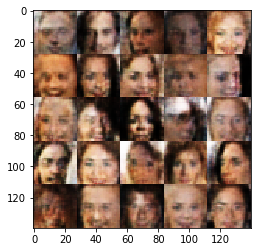

Epoch 3/10... Discriminator Loss: 1.3905... Generator Loss: 0.7912
Epoch 3/10... Discriminator Loss: 1.4580... Generator Loss: 0.6683
Epoch 3/10... Discriminator Loss: 1.4202... Generator Loss: 0.7506
Epoch 3/10... Discriminator Loss: 1.4216... Generator Loss: 0.7436
Epoch 3/10... Discriminator Loss: 1.3915... Generator Loss: 0.7941
Epoch 3/10... Discriminator Loss: 1.3522... Generator Loss: 0.8043
Epoch 3/10... Discriminator Loss: 1.3956... Generator Loss: 0.7423
Epoch 3/10... Discriminator Loss: 1.4924... Generator Loss: 0.6677
Epoch 3/10... Discriminator Loss: 1.3490... Generator Loss: 0.7798
Epoch 3/10... Discriminator Loss: 1.3984... Generator Loss: 0.7690


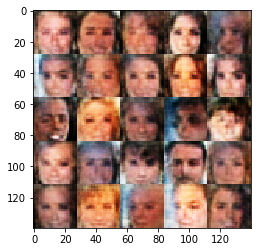

Epoch 3/10... Discriminator Loss: 1.4544... Generator Loss: 0.7077
Epoch 3/10... Discriminator Loss: 1.4781... Generator Loss: 0.6817
Epoch 3/10... Discriminator Loss: 1.4056... Generator Loss: 0.8095
Epoch 3/10... Discriminator Loss: 1.3899... Generator Loss: 0.7277
Epoch 3/10... Discriminator Loss: 1.4326... Generator Loss: 0.7011
Epoch 3/10... Discriminator Loss: 1.3666... Generator Loss: 0.7619
Epoch 3/10... Discriminator Loss: 1.3921... Generator Loss: 0.7212
Epoch 3/10... Discriminator Loss: 1.4232... Generator Loss: 0.6857
Epoch 3/10... Discriminator Loss: 1.4605... Generator Loss: 0.7429
Epoch 3/10... Discriminator Loss: 1.4209... Generator Loss: 0.6599


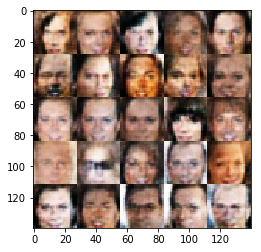

Epoch 3/10... Discriminator Loss: 1.3698... Generator Loss: 0.7331
Epoch 3/10... Discriminator Loss: 1.3836... Generator Loss: 0.8041
Epoch 3/10... Discriminator Loss: 1.4112... Generator Loss: 0.7325
Epoch 3/10... Discriminator Loss: 1.3514... Generator Loss: 0.7902
Epoch 3/10... Discriminator Loss: 1.4597... Generator Loss: 0.7081
Epoch 3/10... Discriminator Loss: 1.3951... Generator Loss: 0.7370
Epoch 3/10... Discriminator Loss: 1.4542... Generator Loss: 0.7065
Epoch 3/10... Discriminator Loss: 1.4071... Generator Loss: 0.7138
Epoch 3/10... Discriminator Loss: 1.4214... Generator Loss: 0.7104
Epoch 3/10... Discriminator Loss: 1.3906... Generator Loss: 0.7660


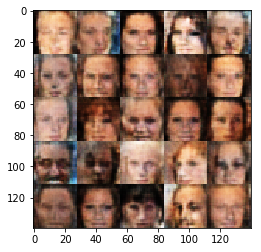

Epoch 3/10... Discriminator Loss: 1.3602... Generator Loss: 0.7261
Epoch 3/10... Discriminator Loss: 1.3616... Generator Loss: 0.7714
Epoch 3/10... Discriminator Loss: 1.4120... Generator Loss: 0.6806
Epoch 3/10... Discriminator Loss: 1.4289... Generator Loss: 0.6945
Epoch 3/10... Discriminator Loss: 1.4479... Generator Loss: 0.7022
Epoch 3/10... Discriminator Loss: 1.4085... Generator Loss: 0.7495
Epoch 3/10... Discriminator Loss: 1.3913... Generator Loss: 0.7684
Epoch 3/10... Discriminator Loss: 1.4282... Generator Loss: 0.6991
Epoch 3/10... Discriminator Loss: 1.3464... Generator Loss: 0.7258
Epoch 3/10... Discriminator Loss: 1.3936... Generator Loss: 0.8412


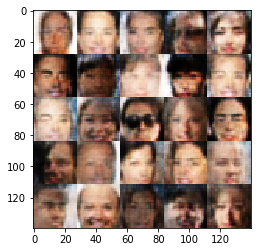

Epoch 3/10... Discriminator Loss: 1.4046... Generator Loss: 0.8000
Epoch 3/10... Discriminator Loss: 1.5533... Generator Loss: 0.7008
Epoch 3/10... Discriminator Loss: 1.3923... Generator Loss: 0.7870
Epoch 3/10... Discriminator Loss: 1.3854... Generator Loss: 0.7556
Epoch 3/10... Discriminator Loss: 1.4912... Generator Loss: 0.7298
Epoch 3/10... Discriminator Loss: 1.3611... Generator Loss: 0.7536
Epoch 3/10... Discriminator Loss: 1.4830... Generator Loss: 0.7250
Epoch 3/10... Discriminator Loss: 1.4250... Generator Loss: 0.7627
Epoch 3/10... Discriminator Loss: 1.4299... Generator Loss: 0.7414
Epoch 3/10... Discriminator Loss: 1.4381... Generator Loss: 0.7220


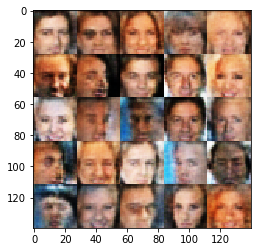

Epoch 3/10... Discriminator Loss: 1.5240... Generator Loss: 0.7519
Epoch 3/10... Discriminator Loss: 1.3669... Generator Loss: 0.7854
Epoch 3/10... Discriminator Loss: 1.4553... Generator Loss: 0.6821
Epoch 3/10... Discriminator Loss: 1.4528... Generator Loss: 0.6832
Epoch 3/10... Discriminator Loss: 1.4335... Generator Loss: 0.7979
Epoch 3/10... Discriminator Loss: 1.4024... Generator Loss: 0.6818
Epoch 3/10... Discriminator Loss: 1.4146... Generator Loss: 0.7020
Epoch 3/10... Discriminator Loss: 1.4400... Generator Loss: 0.7214
Epoch 3/10... Discriminator Loss: 1.3871... Generator Loss: 0.8284
Epoch 3/10... Discriminator Loss: 1.3870... Generator Loss: 0.7683


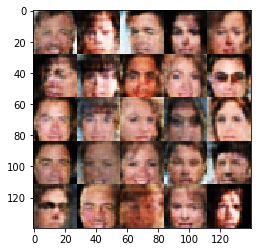

Epoch 3/10... Discriminator Loss: 1.3443... Generator Loss: 0.7964
Epoch 3/10... Discriminator Loss: 1.4376... Generator Loss: 0.7242
Epoch 3/10... Discriminator Loss: 1.4705... Generator Loss: 0.7304
Epoch 3/10... Discriminator Loss: 1.3801... Generator Loss: 0.7649
Epoch 3/10... Discriminator Loss: 1.4216... Generator Loss: 0.7505
Epoch 3/10... Discriminator Loss: 1.4097... Generator Loss: 0.7226
Epoch 3/10... Discriminator Loss: 1.3623... Generator Loss: 0.7384
Epoch 3/10... Discriminator Loss: 1.5315... Generator Loss: 0.6501
Epoch 3/10... Discriminator Loss: 1.3834... Generator Loss: 0.7630
Epoch 4/10... Discriminator Loss: 1.3619... Generator Loss: 0.7121


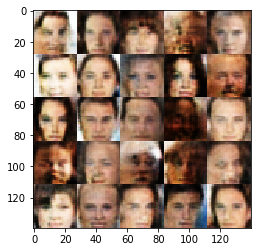

Epoch 4/10... Discriminator Loss: 1.3633... Generator Loss: 0.8069
Epoch 4/10... Discriminator Loss: 1.4650... Generator Loss: 0.7297
Epoch 4/10... Discriminator Loss: 1.4747... Generator Loss: 0.6637
Epoch 4/10... Discriminator Loss: 1.3985... Generator Loss: 0.7557
Epoch 4/10... Discriminator Loss: 1.4229... Generator Loss: 0.7831
Epoch 4/10... Discriminator Loss: 1.3899... Generator Loss: 0.6831
Epoch 4/10... Discriminator Loss: 1.4216... Generator Loss: 0.6674
Epoch 4/10... Discriminator Loss: 1.4378... Generator Loss: 0.6558
Epoch 4/10... Discriminator Loss: 1.4613... Generator Loss: 0.7489
Epoch 4/10... Discriminator Loss: 1.3902... Generator Loss: 0.7746


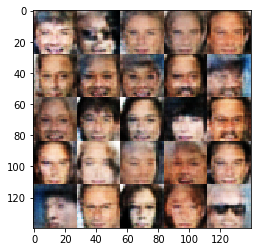

Epoch 4/10... Discriminator Loss: 1.3853... Generator Loss: 0.7350
Epoch 4/10... Discriminator Loss: 1.4267... Generator Loss: 0.7086
Epoch 4/10... Discriminator Loss: 1.4235... Generator Loss: 0.7426
Epoch 4/10... Discriminator Loss: 1.4136... Generator Loss: 0.6700
Epoch 4/10... Discriminator Loss: 1.4104... Generator Loss: 0.7641
Epoch 4/10... Discriminator Loss: 1.3352... Generator Loss: 0.7615
Epoch 4/10... Discriminator Loss: 1.4093... Generator Loss: 0.7107
Epoch 4/10... Discriminator Loss: 1.4602... Generator Loss: 0.7012
Epoch 4/10... Discriminator Loss: 1.4860... Generator Loss: 0.6673
Epoch 4/10... Discriminator Loss: 1.4065... Generator Loss: 0.6726


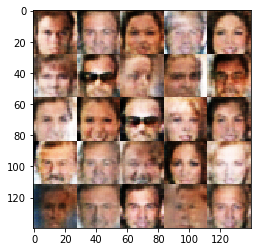

Epoch 4/10... Discriminator Loss: 1.3979... Generator Loss: 0.7423
Epoch 4/10... Discriminator Loss: 1.4204... Generator Loss: 0.7318
Epoch 4/10... Discriminator Loss: 1.3827... Generator Loss: 0.7324
Epoch 4/10... Discriminator Loss: 1.3764... Generator Loss: 0.7279
Epoch 4/10... Discriminator Loss: 1.3636... Generator Loss: 0.7649
Epoch 4/10... Discriminator Loss: 1.4872... Generator Loss: 0.7119
Epoch 4/10... Discriminator Loss: 1.3684... Generator Loss: 0.6867
Epoch 4/10... Discriminator Loss: 1.4428... Generator Loss: 0.7093
Epoch 4/10... Discriminator Loss: 1.4659... Generator Loss: 0.7002
Epoch 4/10... Discriminator Loss: 1.4824... Generator Loss: 0.6764


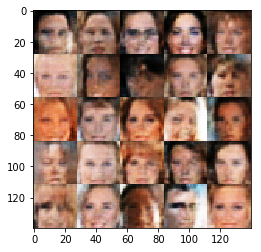

Epoch 4/10... Discriminator Loss: 1.4390... Generator Loss: 0.7358
Epoch 4/10... Discriminator Loss: 1.4309... Generator Loss: 0.7330
Epoch 4/10... Discriminator Loss: 1.4751... Generator Loss: 0.7152
Epoch 4/10... Discriminator Loss: 1.4143... Generator Loss: 0.6737
Epoch 4/10... Discriminator Loss: 1.4458... Generator Loss: 0.7567
Epoch 4/10... Discriminator Loss: 1.3934... Generator Loss: 0.6943
Epoch 4/10... Discriminator Loss: 1.4701... Generator Loss: 0.7136
Epoch 4/10... Discriminator Loss: 1.3460... Generator Loss: 0.7902
Epoch 4/10... Discriminator Loss: 1.3931... Generator Loss: 0.7266
Epoch 4/10... Discriminator Loss: 1.3616... Generator Loss: 0.7493


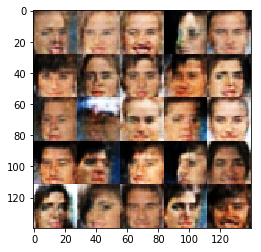

Epoch 4/10... Discriminator Loss: 1.3680... Generator Loss: 0.7318
Epoch 4/10... Discriminator Loss: 1.3526... Generator Loss: 0.7104
Epoch 4/10... Discriminator Loss: 1.4381... Generator Loss: 0.7250
Epoch 4/10... Discriminator Loss: 1.4351... Generator Loss: 0.7102
Epoch 4/10... Discriminator Loss: 1.4408... Generator Loss: 0.6730
Epoch 4/10... Discriminator Loss: 1.4641... Generator Loss: 0.7468
Epoch 4/10... Discriminator Loss: 1.4596... Generator Loss: 0.6930
Epoch 4/10... Discriminator Loss: 1.4229... Generator Loss: 0.7173
Epoch 4/10... Discriminator Loss: 1.4767... Generator Loss: 0.6958
Epoch 4/10... Discriminator Loss: 1.5300... Generator Loss: 0.6212


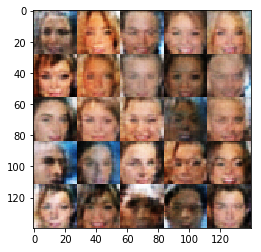

Epoch 4/10... Discriminator Loss: 1.4325... Generator Loss: 0.6881
Epoch 4/10... Discriminator Loss: 1.3664... Generator Loss: 0.7598
Epoch 4/10... Discriminator Loss: 1.3828... Generator Loss: 0.7199
Epoch 4/10... Discriminator Loss: 1.3791... Generator Loss: 0.7592
Epoch 4/10... Discriminator Loss: 1.5390... Generator Loss: 0.5936
Epoch 4/10... Discriminator Loss: 1.4825... Generator Loss: 0.7162
Epoch 4/10... Discriminator Loss: 1.5534... Generator Loss: 0.6147
Epoch 4/10... Discriminator Loss: 1.3732... Generator Loss: 0.7720
Epoch 4/10... Discriminator Loss: 1.4066... Generator Loss: 0.7205
Epoch 4/10... Discriminator Loss: 1.5608... Generator Loss: 0.6468


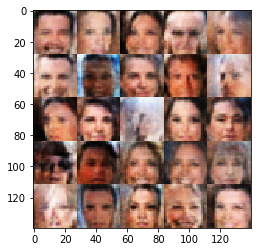

Epoch 4/10... Discriminator Loss: 1.4836... Generator Loss: 0.6595
Epoch 4/10... Discriminator Loss: 1.4683... Generator Loss: 0.7414
Epoch 4/10... Discriminator Loss: 1.4643... Generator Loss: 0.6814
Epoch 4/10... Discriminator Loss: 1.4745... Generator Loss: 0.6250
Epoch 4/10... Discriminator Loss: 1.4935... Generator Loss: 0.6472
Epoch 4/10... Discriminator Loss: 1.5096... Generator Loss: 0.6633
Epoch 4/10... Discriminator Loss: 1.3600... Generator Loss: 0.7814
Epoch 4/10... Discriminator Loss: 1.4103... Generator Loss: 0.7309
Epoch 4/10... Discriminator Loss: 1.4819... Generator Loss: 0.7014
Epoch 4/10... Discriminator Loss: 1.3952... Generator Loss: 0.7682


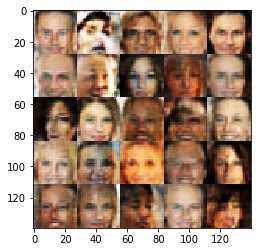

Epoch 4/10... Discriminator Loss: 1.4454... Generator Loss: 0.6596
Epoch 4/10... Discriminator Loss: 1.3948... Generator Loss: 0.7667
Epoch 4/10... Discriminator Loss: 1.4111... Generator Loss: 0.6959
Epoch 4/10... Discriminator Loss: 1.4067... Generator Loss: 0.6936
Epoch 4/10... Discriminator Loss: 1.3740... Generator Loss: 0.7484
Epoch 4/10... Discriminator Loss: 1.4352... Generator Loss: 0.6355
Epoch 4/10... Discriminator Loss: 1.4281... Generator Loss: 0.6942
Epoch 4/10... Discriminator Loss: 1.4103... Generator Loss: 0.6884
Epoch 4/10... Discriminator Loss: 1.4329... Generator Loss: 0.7004
Epoch 4/10... Discriminator Loss: 1.3944... Generator Loss: 0.7422


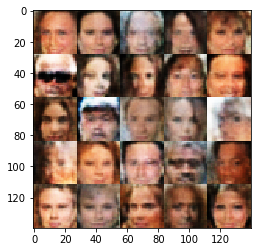

Epoch 4/10... Discriminator Loss: 1.3593... Generator Loss: 0.7574
Epoch 4/10... Discriminator Loss: 1.3250... Generator Loss: 0.7919
Epoch 4/10... Discriminator Loss: 1.3928... Generator Loss: 0.7217
Epoch 4/10... Discriminator Loss: 1.3824... Generator Loss: 0.6566
Epoch 4/10... Discriminator Loss: 1.4459... Generator Loss: 0.7006
Epoch 4/10... Discriminator Loss: 1.4136... Generator Loss: 0.6833
Epoch 4/10... Discriminator Loss: 1.4946... Generator Loss: 0.6489
Epoch 4/10... Discriminator Loss: 1.4308... Generator Loss: 0.6503
Epoch 4/10... Discriminator Loss: 1.3595... Generator Loss: 0.7320
Epoch 4/10... Discriminator Loss: 1.4190... Generator Loss: 0.7183


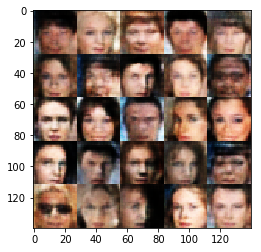

Epoch 4/10... Discriminator Loss: 1.5286... Generator Loss: 0.6659
Epoch 4/10... Discriminator Loss: 1.4831... Generator Loss: 0.6501
Epoch 4/10... Discriminator Loss: 1.5303... Generator Loss: 0.6345
Epoch 4/10... Discriminator Loss: 1.4562... Generator Loss: 0.6459
Epoch 4/10... Discriminator Loss: 1.4713... Generator Loss: 0.5847
Epoch 4/10... Discriminator Loss: 1.4960... Generator Loss: 0.6562
Epoch 4/10... Discriminator Loss: 1.4523... Generator Loss: 0.7182
Epoch 4/10... Discriminator Loss: 1.3298... Generator Loss: 0.7233
Epoch 4/10... Discriminator Loss: 1.5183... Generator Loss: 0.6810
Epoch 4/10... Discriminator Loss: 1.4211... Generator Loss: 0.6969


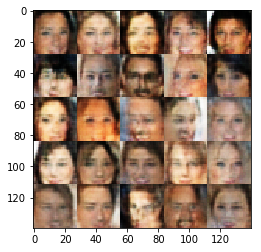

Epoch 4/10... Discriminator Loss: 1.5511... Generator Loss: 0.6553
Epoch 4/10... Discriminator Loss: 1.4628... Generator Loss: 0.7912
Epoch 4/10... Discriminator Loss: 1.3764... Generator Loss: 0.7812
Epoch 4/10... Discriminator Loss: 1.5892... Generator Loss: 0.6022
Epoch 4/10... Discriminator Loss: 1.4318... Generator Loss: 0.7491
Epoch 4/10... Discriminator Loss: 1.5124... Generator Loss: 0.6481
Epoch 4/10... Discriminator Loss: 1.3954... Generator Loss: 0.6826
Epoch 4/10... Discriminator Loss: 1.3888... Generator Loss: 0.7175
Epoch 4/10... Discriminator Loss: 1.4345... Generator Loss: 0.8146
Epoch 4/10... Discriminator Loss: 1.4292... Generator Loss: 0.7113


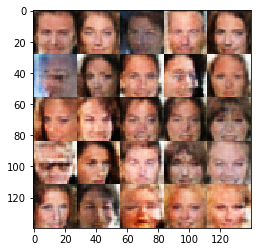

Epoch 4/10... Discriminator Loss: 1.3986... Generator Loss: 0.8237
Epoch 4/10... Discriminator Loss: 1.4311... Generator Loss: 0.6346
Epoch 4/10... Discriminator Loss: 1.4679... Generator Loss: 0.6047
Epoch 4/10... Discriminator Loss: 1.4563... Generator Loss: 0.7299
Epoch 4/10... Discriminator Loss: 1.4288... Generator Loss: 0.7119
Epoch 4/10... Discriminator Loss: 1.4155... Generator Loss: 0.6174
Epoch 4/10... Discriminator Loss: 1.3875... Generator Loss: 0.7149
Epoch 4/10... Discriminator Loss: 1.3686... Generator Loss: 0.7170
Epoch 4/10... Discriminator Loss: 1.3853... Generator Loss: 0.6612
Epoch 4/10... Discriminator Loss: 1.4051... Generator Loss: 0.6202


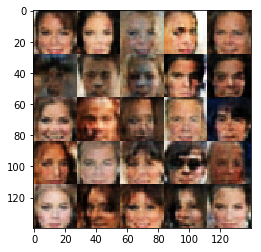

Epoch 4/10... Discriminator Loss: 1.4289... Generator Loss: 0.6678
Epoch 4/10... Discriminator Loss: 1.3924... Generator Loss: 0.7436
Epoch 4/10... Discriminator Loss: 1.4586... Generator Loss: 0.6876
Epoch 4/10... Discriminator Loss: 1.3956... Generator Loss: 0.7195
Epoch 4/10... Discriminator Loss: 1.4197... Generator Loss: 0.6763
Epoch 4/10... Discriminator Loss: 1.5347... Generator Loss: 0.6448
Epoch 4/10... Discriminator Loss: 1.4902... Generator Loss: 0.6580
Epoch 4/10... Discriminator Loss: 1.4409... Generator Loss: 0.6416
Epoch 4/10... Discriminator Loss: 1.4096... Generator Loss: 0.6694
Epoch 4/10... Discriminator Loss: 1.4043... Generator Loss: 0.8081


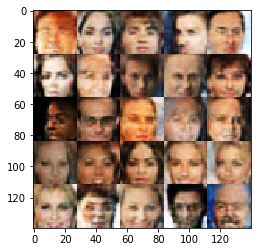

Epoch 4/10... Discriminator Loss: 1.3911... Generator Loss: 0.7352
Epoch 4/10... Discriminator Loss: 1.4669... Generator Loss: 0.7110
Epoch 4/10... Discriminator Loss: 1.4923... Generator Loss: 0.6806
Epoch 4/10... Discriminator Loss: 1.4402... Generator Loss: 0.6907
Epoch 4/10... Discriminator Loss: 1.4273... Generator Loss: 0.7083
Epoch 4/10... Discriminator Loss: 1.4459... Generator Loss: 0.7323
Epoch 4/10... Discriminator Loss: 1.3826... Generator Loss: 0.7419
Epoch 4/10... Discriminator Loss: 1.4682... Generator Loss: 0.6903
Epoch 4/10... Discriminator Loss: 1.5210... Generator Loss: 0.6771
Epoch 4/10... Discriminator Loss: 1.4369... Generator Loss: 0.7323


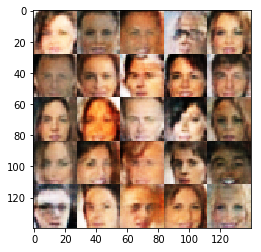

Epoch 4/10... Discriminator Loss: 1.5659... Generator Loss: 0.5163
Epoch 4/10... Discriminator Loss: 1.3345... Generator Loss: 0.7225
Epoch 4/10... Discriminator Loss: 1.3949... Generator Loss: 0.8142
Epoch 4/10... Discriminator Loss: 1.3680... Generator Loss: 0.7810
Epoch 4/10... Discriminator Loss: 1.3746... Generator Loss: 0.6829
Epoch 4/10... Discriminator Loss: 1.4751... Generator Loss: 0.6272
Epoch 4/10... Discriminator Loss: 1.4741... Generator Loss: 0.6474
Epoch 4/10... Discriminator Loss: 1.3873... Generator Loss: 0.6937
Epoch 4/10... Discriminator Loss: 1.4610... Generator Loss: 0.6275
Epoch 4/10... Discriminator Loss: 1.4733... Generator Loss: 0.6953


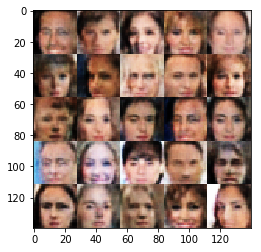

Epoch 4/10... Discriminator Loss: 1.4361... Generator Loss: 0.6067
Epoch 4/10... Discriminator Loss: 1.5063... Generator Loss: 0.7013
Epoch 4/10... Discriminator Loss: 1.4971... Generator Loss: 0.5760
Epoch 4/10... Discriminator Loss: 1.3905... Generator Loss: 0.6869
Epoch 4/10... Discriminator Loss: 1.4407... Generator Loss: 0.6100
Epoch 4/10... Discriminator Loss: 1.5205... Generator Loss: 0.6942
Epoch 4/10... Discriminator Loss: 1.4213... Generator Loss: 0.7422
Epoch 4/10... Discriminator Loss: 1.3666... Generator Loss: 0.7043
Epoch 4/10... Discriminator Loss: 1.4352... Generator Loss: 0.6344
Epoch 4/10... Discriminator Loss: 1.4456... Generator Loss: 0.6283


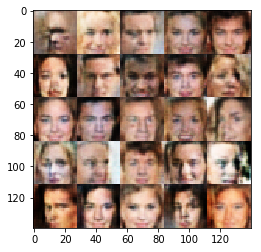

Epoch 4/10... Discriminator Loss: 1.3835... Generator Loss: 0.6708
Epoch 4/10... Discriminator Loss: 1.5868... Generator Loss: 0.6425
Epoch 4/10... Discriminator Loss: 1.4768... Generator Loss: 0.5911
Epoch 4/10... Discriminator Loss: 1.4785... Generator Loss: 0.7890
Epoch 4/10... Discriminator Loss: 1.4085... Generator Loss: 0.7569
Epoch 4/10... Discriminator Loss: 1.4222... Generator Loss: 0.7138
Epoch 4/10... Discriminator Loss: 1.4057... Generator Loss: 0.7053
Epoch 4/10... Discriminator Loss: 1.4686... Generator Loss: 0.6148
Epoch 4/10... Discriminator Loss: 1.5383... Generator Loss: 0.6677
Epoch 4/10... Discriminator Loss: 1.3891... Generator Loss: 0.6731


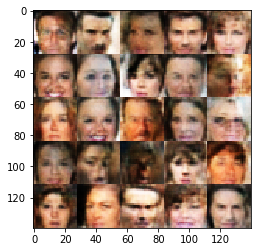

Epoch 4/10... Discriminator Loss: 1.5278... Generator Loss: 0.6508
Epoch 4/10... Discriminator Loss: 1.4473... Generator Loss: 0.7121
Epoch 4/10... Discriminator Loss: 1.4475... Generator Loss: 0.6594
Epoch 4/10... Discriminator Loss: 1.4512... Generator Loss: 0.7123
Epoch 4/10... Discriminator Loss: 1.4713... Generator Loss: 0.7304
Epoch 4/10... Discriminator Loss: 1.4725... Generator Loss: 0.5182
Epoch 4/10... Discriminator Loss: 1.4552... Generator Loss: 0.7293
Epoch 4/10... Discriminator Loss: 1.4874... Generator Loss: 0.6555
Epoch 4/10... Discriminator Loss: 1.4370... Generator Loss: 0.6668
Epoch 4/10... Discriminator Loss: 1.4042... Generator Loss: 0.7857


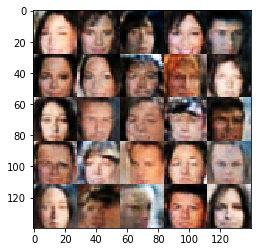

Epoch 4/10... Discriminator Loss: 1.3975... Generator Loss: 0.6101
Epoch 4/10... Discriminator Loss: 1.3110... Generator Loss: 0.6899
Epoch 4/10... Discriminator Loss: 1.4380... Generator Loss: 0.6100
Epoch 4/10... Discriminator Loss: 1.4751... Generator Loss: 0.5995
Epoch 4/10... Discriminator Loss: 1.4846... Generator Loss: 0.6150
Epoch 4/10... Discriminator Loss: 1.5958... Generator Loss: 0.5168
Epoch 4/10... Discriminator Loss: 1.5365... Generator Loss: 0.5142
Epoch 4/10... Discriminator Loss: 1.4592... Generator Loss: 0.6129
Epoch 4/10... Discriminator Loss: 1.4882... Generator Loss: 0.5874
Epoch 4/10... Discriminator Loss: 1.4848... Generator Loss: 0.5544


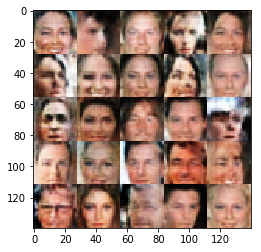

Epoch 4/10... Discriminator Loss: 1.3632... Generator Loss: 0.6984
Epoch 4/10... Discriminator Loss: 1.4653... Generator Loss: 0.7255
Epoch 4/10... Discriminator Loss: 1.4117... Generator Loss: 0.5980
Epoch 4/10... Discriminator Loss: 1.3944... Generator Loss: 0.6954
Epoch 4/10... Discriminator Loss: 1.4526... Generator Loss: 0.6565
Epoch 4/10... Discriminator Loss: 1.4229... Generator Loss: 0.7110
Epoch 4/10... Discriminator Loss: 1.4077... Generator Loss: 0.7586
Epoch 4/10... Discriminator Loss: 1.4961... Generator Loss: 0.5236
Epoch 4/10... Discriminator Loss: 1.3759... Generator Loss: 0.6237
Epoch 4/10... Discriminator Loss: 1.5390... Generator Loss: 0.5946


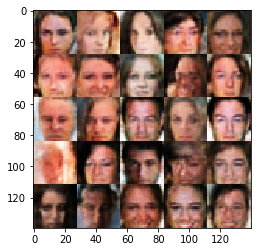

Epoch 4/10... Discriminator Loss: 1.4754... Generator Loss: 0.6673
Epoch 4/10... Discriminator Loss: 1.3504... Generator Loss: 0.6884
Epoch 4/10... Discriminator Loss: 1.3765... Generator Loss: 0.5976
Epoch 4/10... Discriminator Loss: 1.3269... Generator Loss: 0.5943
Epoch 4/10... Discriminator Loss: 1.4568... Generator Loss: 0.5717
Epoch 4/10... Discriminator Loss: 1.4806... Generator Loss: 0.5875
Epoch 4/10... Discriminator Loss: 1.6083... Generator Loss: 0.5437
Epoch 4/10... Discriminator Loss: 1.3216... Generator Loss: 0.6533
Epoch 4/10... Discriminator Loss: 1.5744... Generator Loss: 0.5734
Epoch 4/10... Discriminator Loss: 1.5453... Generator Loss: 0.6052


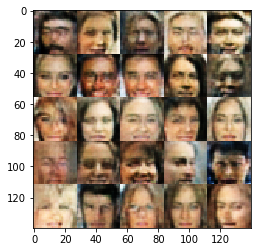

Epoch 4/10... Discriminator Loss: 1.4469... Generator Loss: 0.7118
Epoch 4/10... Discriminator Loss: 1.5698... Generator Loss: 0.6783
Epoch 4/10... Discriminator Loss: 1.5408... Generator Loss: 0.6183
Epoch 4/10... Discriminator Loss: 1.4526... Generator Loss: 0.6630
Epoch 4/10... Discriminator Loss: 1.4181... Generator Loss: 0.6576
Epoch 4/10... Discriminator Loss: 1.3847... Generator Loss: 0.7499
Epoch 4/10... Discriminator Loss: 1.5179... Generator Loss: 0.7020
Epoch 4/10... Discriminator Loss: 1.5246... Generator Loss: 0.5269
Epoch 4/10... Discriminator Loss: 1.4586... Generator Loss: 0.5263
Epoch 4/10... Discriminator Loss: 1.4042... Generator Loss: 0.6099


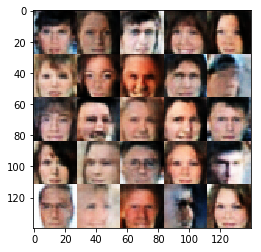

Epoch 4/10... Discriminator Loss: 1.5229... Generator Loss: 0.6785
Epoch 4/10... Discriminator Loss: 1.3967... Generator Loss: 0.8891
Epoch 4/10... Discriminator Loss: 1.3623... Generator Loss: 0.7846
Epoch 4/10... Discriminator Loss: 1.6817... Generator Loss: 0.5469
Epoch 4/10... Discriminator Loss: 1.6771... Generator Loss: 0.4445
Epoch 4/10... Discriminator Loss: 1.4004... Generator Loss: 0.5553
Epoch 4/10... Discriminator Loss: 1.5682... Generator Loss: 0.5507
Epoch 4/10... Discriminator Loss: 1.3704... Generator Loss: 0.7840
Epoch 4/10... Discriminator Loss: 1.4903... Generator Loss: 0.6752
Epoch 4/10... Discriminator Loss: 1.3607... Generator Loss: 0.6577


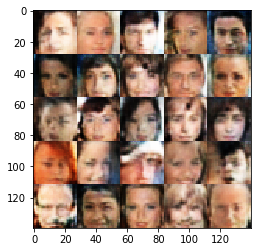

Epoch 4/10... Discriminator Loss: 1.5590... Generator Loss: 0.4399
Epoch 4/10... Discriminator Loss: 1.3921... Generator Loss: 0.6391
Epoch 4/10... Discriminator Loss: 1.5971... Generator Loss: 0.5825
Epoch 4/10... Discriminator Loss: 1.5328... Generator Loss: 0.5392
Epoch 4/10... Discriminator Loss: 1.4866... Generator Loss: 0.6007
Epoch 4/10... Discriminator Loss: 1.4252... Generator Loss: 0.6619
Epoch 4/10... Discriminator Loss: 1.6052... Generator Loss: 0.6879
Epoch 4/10... Discriminator Loss: 1.5970... Generator Loss: 0.5053
Epoch 4/10... Discriminator Loss: 1.4107... Generator Loss: 0.5889
Epoch 4/10... Discriminator Loss: 1.5934... Generator Loss: 0.4201


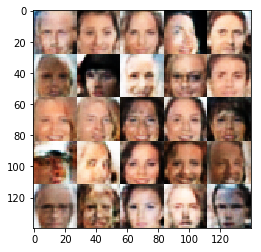

Epoch 4/10... Discriminator Loss: 1.6205... Generator Loss: 0.4186
Epoch 4/10... Discriminator Loss: 1.5973... Generator Loss: 0.4878
Epoch 4/10... Discriminator Loss: 1.4403... Generator Loss: 0.6728
Epoch 4/10... Discriminator Loss: 1.5760... Generator Loss: 0.4816
Epoch 4/10... Discriminator Loss: 1.4983... Generator Loss: 0.7068
Epoch 4/10... Discriminator Loss: 1.5121... Generator Loss: 0.5504
Epoch 4/10... Discriminator Loss: 1.5627... Generator Loss: 0.6747
Epoch 4/10... Discriminator Loss: 1.3459... Generator Loss: 0.6991
Epoch 4/10... Discriminator Loss: 1.4767... Generator Loss: 0.6405
Epoch 4/10... Discriminator Loss: 1.3758... Generator Loss: 0.6763


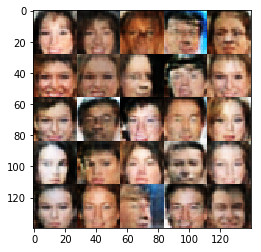

Epoch 4/10... Discriminator Loss: 1.3834... Generator Loss: 0.7229
Epoch 4/10... Discriminator Loss: 1.5224... Generator Loss: 0.6000
Epoch 4/10... Discriminator Loss: 1.3394... Generator Loss: 0.7113
Epoch 4/10... Discriminator Loss: 1.5436... Generator Loss: 0.6578
Epoch 4/10... Discriminator Loss: 1.5471... Generator Loss: 0.5566
Epoch 4/10... Discriminator Loss: 1.5670... Generator Loss: 0.5116
Epoch 4/10... Discriminator Loss: 1.4143... Generator Loss: 0.6470
Epoch 4/10... Discriminator Loss: 1.5320... Generator Loss: 0.5108
Epoch 4/10... Discriminator Loss: 1.4781... Generator Loss: 0.5772
Epoch 4/10... Discriminator Loss: 1.5334... Generator Loss: 0.5905


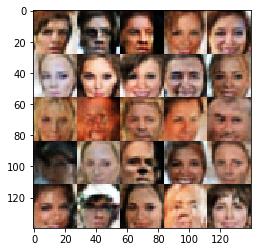

Epoch 4/10... Discriminator Loss: 1.4938... Generator Loss: 0.6686
Epoch 4/10... Discriminator Loss: 1.2638... Generator Loss: 0.7675
Epoch 4/10... Discriminator Loss: 1.5246... Generator Loss: 0.4854
Epoch 4/10... Discriminator Loss: 1.5374... Generator Loss: 0.5043
Epoch 4/10... Discriminator Loss: 1.6079... Generator Loss: 0.5556
Epoch 4/10... Discriminator Loss: 1.3335... Generator Loss: 0.7519
Epoch 4/10... Discriminator Loss: 1.4054... Generator Loss: 0.5500
Epoch 4/10... Discriminator Loss: 1.5899... Generator Loss: 0.5497
Epoch 4/10... Discriminator Loss: 1.3556... Generator Loss: 0.6718
Epoch 4/10... Discriminator Loss: 1.4550... Generator Loss: 0.7116


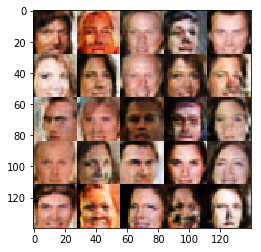

Epoch 4/10... Discriminator Loss: 1.4493... Generator Loss: 0.6561
Epoch 4/10... Discriminator Loss: 1.4223... Generator Loss: 0.7365
Epoch 4/10... Discriminator Loss: 1.4250... Generator Loss: 0.7245
Epoch 4/10... Discriminator Loss: 1.4706... Generator Loss: 0.6456
Epoch 4/10... Discriminator Loss: 1.6853... Generator Loss: 0.4439
Epoch 4/10... Discriminator Loss: 1.6643... Generator Loss: 0.4862
Epoch 4/10... Discriminator Loss: 1.6568... Generator Loss: 0.6005
Epoch 4/10... Discriminator Loss: 1.5133... Generator Loss: 0.4926
Epoch 4/10... Discriminator Loss: 1.5075... Generator Loss: 0.5167
Epoch 4/10... Discriminator Loss: 1.5559... Generator Loss: 0.4462


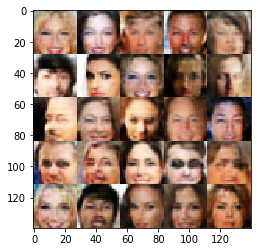

Epoch 4/10... Discriminator Loss: 1.7641... Generator Loss: 0.4581
Epoch 4/10... Discriminator Loss: 1.5677... Generator Loss: 0.5925
Epoch 4/10... Discriminator Loss: 1.3499... Generator Loss: 0.6302
Epoch 4/10... Discriminator Loss: 1.4589... Generator Loss: 0.6962
Epoch 4/10... Discriminator Loss: 1.5889... Generator Loss: 0.5743
Epoch 4/10... Discriminator Loss: 1.5307... Generator Loss: 0.5062
Epoch 4/10... Discriminator Loss: 1.4032... Generator Loss: 0.6244
Epoch 4/10... Discriminator Loss: 1.4202... Generator Loss: 0.7700
Epoch 4/10... Discriminator Loss: 1.6216... Generator Loss: 0.4674
Epoch 4/10... Discriminator Loss: 1.5201... Generator Loss: 0.6200


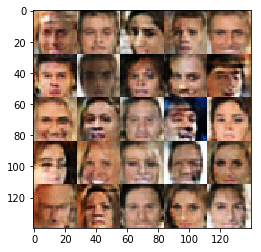

Epoch 4/10... Discriminator Loss: 1.2857... Generator Loss: 0.7398
Epoch 4/10... Discriminator Loss: 1.5198... Generator Loss: 0.5951
Epoch 4/10... Discriminator Loss: 1.8963... Generator Loss: 0.3166
Epoch 4/10... Discriminator Loss: 1.4222... Generator Loss: 0.5687
Epoch 4/10... Discriminator Loss: 1.4497... Generator Loss: 0.5399
Epoch 4/10... Discriminator Loss: 1.4797... Generator Loss: 0.6268
Epoch 4/10... Discriminator Loss: 1.4921... Generator Loss: 0.5420
Epoch 4/10... Discriminator Loss: 1.2932... Generator Loss: 0.7593
Epoch 4/10... Discriminator Loss: 1.3428... Generator Loss: 0.6565
Epoch 4/10... Discriminator Loss: 1.6590... Generator Loss: 0.3619


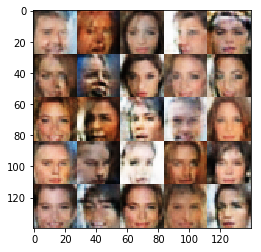

Epoch 4/10... Discriminator Loss: 1.6900... Generator Loss: 0.3861
Epoch 4/10... Discriminator Loss: 1.3889... Generator Loss: 0.7862
Epoch 4/10... Discriminator Loss: 1.4110... Generator Loss: 0.6276
Epoch 4/10... Discriminator Loss: 1.6468... Generator Loss: 0.4692
Epoch 4/10... Discriminator Loss: 1.4106... Generator Loss: 0.7604
Epoch 4/10... Discriminator Loss: 1.2612... Generator Loss: 0.6961
Epoch 4/10... Discriminator Loss: 1.5246... Generator Loss: 0.5033
Epoch 4/10... Discriminator Loss: 1.3990... Generator Loss: 0.6355
Epoch 4/10... Discriminator Loss: 1.6199... Generator Loss: 0.6557
Epoch 4/10... Discriminator Loss: 1.6346... Generator Loss: 0.3736


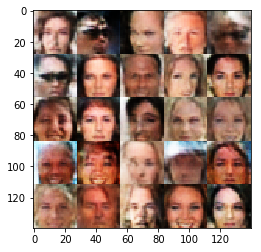

Epoch 4/10... Discriminator Loss: 1.7545... Generator Loss: 0.4855
Epoch 4/10... Discriminator Loss: 1.4106... Generator Loss: 0.5436
Epoch 4/10... Discriminator Loss: 1.5997... Generator Loss: 0.5637
Epoch 4/10... Discriminator Loss: 1.5631... Generator Loss: 0.5071
Epoch 4/10... Discriminator Loss: 1.5704... Generator Loss: 0.5766
Epoch 4/10... Discriminator Loss: 1.4158... Generator Loss: 0.6877
Epoch 5/10... Discriminator Loss: 1.6027... Generator Loss: 0.5604
Epoch 5/10... Discriminator Loss: 1.4414... Generator Loss: 0.5805
Epoch 5/10... Discriminator Loss: 1.4029... Generator Loss: 0.6644
Epoch 5/10... Discriminator Loss: 1.6469... Generator Loss: 0.4310


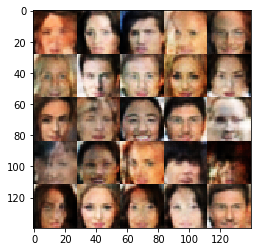

Epoch 5/10... Discriminator Loss: 1.2307... Generator Loss: 0.7947
Epoch 5/10... Discriminator Loss: 1.5791... Generator Loss: 0.4882
Epoch 5/10... Discriminator Loss: 1.4992... Generator Loss: 0.5754
Epoch 5/10... Discriminator Loss: 1.3402... Generator Loss: 0.6616
Epoch 5/10... Discriminator Loss: 1.3703... Generator Loss: 0.8040
Epoch 5/10... Discriminator Loss: 1.4838... Generator Loss: 0.4931
Epoch 5/10... Discriminator Loss: 1.7624... Generator Loss: 0.3924
Epoch 5/10... Discriminator Loss: 1.6160... Generator Loss: 0.4712
Epoch 5/10... Discriminator Loss: 1.3626... Generator Loss: 0.6041
Epoch 5/10... Discriminator Loss: 1.7820... Generator Loss: 0.4484


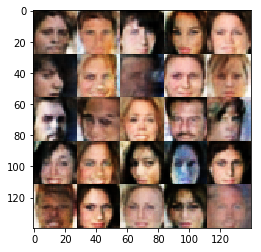

Epoch 5/10... Discriminator Loss: 1.6981... Generator Loss: 0.4505
Epoch 5/10... Discriminator Loss: 1.4978... Generator Loss: 0.5774
Epoch 5/10... Discriminator Loss: 1.5325... Generator Loss: 0.4548
Epoch 5/10... Discriminator Loss: 1.7429... Generator Loss: 0.5013
Epoch 5/10... Discriminator Loss: 1.6800... Generator Loss: 0.4169
Epoch 5/10... Discriminator Loss: 1.5388... Generator Loss: 0.5462
Epoch 5/10... Discriminator Loss: 1.2827... Generator Loss: 0.7952
Epoch 5/10... Discriminator Loss: 1.4558... Generator Loss: 0.7220
Epoch 5/10... Discriminator Loss: 1.7545... Generator Loss: 0.3452
Epoch 5/10... Discriminator Loss: 1.6983... Generator Loss: 0.4373


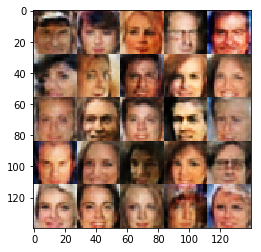

Epoch 5/10... Discriminator Loss: 1.4744... Generator Loss: 0.5436
Epoch 5/10... Discriminator Loss: 1.4492... Generator Loss: 0.6728
Epoch 5/10... Discriminator Loss: 1.3740... Generator Loss: 0.5764
Epoch 5/10... Discriminator Loss: 1.5009... Generator Loss: 0.5537
Epoch 5/10... Discriminator Loss: 1.5176... Generator Loss: 0.4064
Epoch 5/10... Discriminator Loss: 1.8781... Generator Loss: 0.3306
Epoch 5/10... Discriminator Loss: 1.6072... Generator Loss: 0.6052
Epoch 5/10... Discriminator Loss: 1.6134... Generator Loss: 0.4818
Epoch 5/10... Discriminator Loss: 1.5386... Generator Loss: 0.6592
Epoch 5/10... Discriminator Loss: 1.6264... Generator Loss: 0.5864


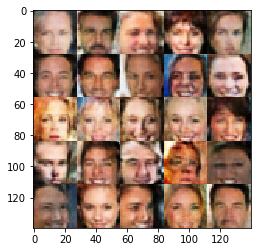

Epoch 5/10... Discriminator Loss: 1.5697... Generator Loss: 0.4617
Epoch 5/10... Discriminator Loss: 1.4805... Generator Loss: 0.6620
Epoch 5/10... Discriminator Loss: 1.3831... Generator Loss: 0.5183
Epoch 5/10... Discriminator Loss: 1.6942... Generator Loss: 0.5586
Epoch 5/10... Discriminator Loss: 1.5101... Generator Loss: 0.9063
Epoch 5/10... Discriminator Loss: 1.6607... Generator Loss: 0.6512
Epoch 5/10... Discriminator Loss: 1.6385... Generator Loss: 0.4143
Epoch 5/10... Discriminator Loss: 1.5769... Generator Loss: 0.3979
Epoch 5/10... Discriminator Loss: 1.7015... Generator Loss: 0.5552
Epoch 5/10... Discriminator Loss: 1.3162... Generator Loss: 0.7507


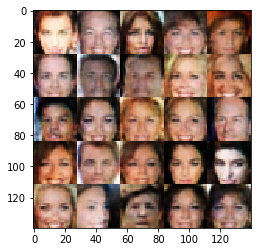

Epoch 5/10... Discriminator Loss: 1.5974... Generator Loss: 0.5277
Epoch 5/10... Discriminator Loss: 1.5541... Generator Loss: 0.3614
Epoch 5/10... Discriminator Loss: 1.3733... Generator Loss: 0.9956
Epoch 5/10... Discriminator Loss: 1.6556... Generator Loss: 0.4460
Epoch 5/10... Discriminator Loss: 1.8409... Generator Loss: 0.4148
Epoch 5/10... Discriminator Loss: 1.7875... Generator Loss: 0.4093
Epoch 5/10... Discriminator Loss: 1.4865... Generator Loss: 0.5795
Epoch 5/10... Discriminator Loss: 1.6154... Generator Loss: 0.8844
Epoch 5/10... Discriminator Loss: 1.2941... Generator Loss: 0.7941
Epoch 5/10... Discriminator Loss: 1.6640... Generator Loss: 0.4552


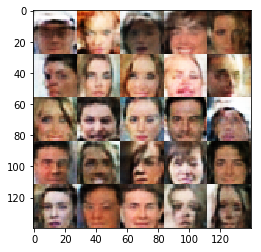

Epoch 5/10... Discriminator Loss: 1.5144... Generator Loss: 0.5068
Epoch 5/10... Discriminator Loss: 1.5415... Generator Loss: 0.4860
Epoch 5/10... Discriminator Loss: 1.6115... Generator Loss: 0.5045
Epoch 5/10... Discriminator Loss: 1.9112... Generator Loss: 0.3390
Epoch 5/10... Discriminator Loss: 1.4391... Generator Loss: 0.7063
Epoch 5/10... Discriminator Loss: 1.5740... Generator Loss: 0.4865
Epoch 5/10... Discriminator Loss: 1.6738... Generator Loss: 0.4481
Epoch 5/10... Discriminator Loss: 1.4113... Generator Loss: 0.5902
Epoch 5/10... Discriminator Loss: 1.8056... Generator Loss: 0.3363
Epoch 5/10... Discriminator Loss: 1.4394... Generator Loss: 0.6796


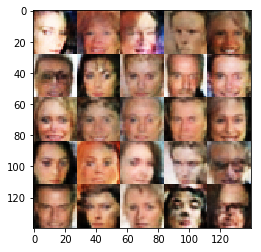

Epoch 5/10... Discriminator Loss: 1.4605... Generator Loss: 0.5913
Epoch 5/10... Discriminator Loss: 1.6138... Generator Loss: 0.5305
Epoch 5/10... Discriminator Loss: 1.4485... Generator Loss: 0.4850
Epoch 5/10... Discriminator Loss: 1.5940... Generator Loss: 0.3974
Epoch 5/10... Discriminator Loss: 1.1410... Generator Loss: 1.2044
Epoch 5/10... Discriminator Loss: 1.6458... Generator Loss: 0.3635
Epoch 5/10... Discriminator Loss: 1.4434... Generator Loss: 0.6107
Epoch 5/10... Discriminator Loss: 1.7859... Generator Loss: 0.3852
Epoch 5/10... Discriminator Loss: 1.7304... Generator Loss: 0.4252
Epoch 5/10... Discriminator Loss: 1.6899... Generator Loss: 0.4150


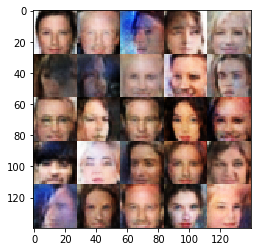

Epoch 5/10... Discriminator Loss: 1.7593... Generator Loss: 0.3380
Epoch 5/10... Discriminator Loss: 2.0574... Generator Loss: 0.3508
Epoch 5/10... Discriminator Loss: 1.3316... Generator Loss: 0.9416
Epoch 5/10... Discriminator Loss: 1.3979... Generator Loss: 0.5643
Epoch 5/10... Discriminator Loss: 1.6662... Generator Loss: 0.5289
Epoch 5/10... Discriminator Loss: 1.5719... Generator Loss: 0.6531
Epoch 5/10... Discriminator Loss: 1.6834... Generator Loss: 0.4995
Epoch 5/10... Discriminator Loss: 1.6598... Generator Loss: 0.4441
Epoch 5/10... Discriminator Loss: 1.4538... Generator Loss: 0.4770
Epoch 5/10... Discriminator Loss: 1.6644... Generator Loss: 0.4269


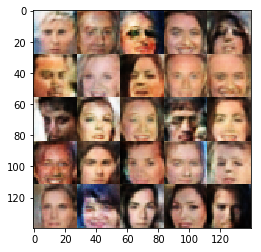

Epoch 5/10... Discriminator Loss: 1.8139... Generator Loss: 0.5015
Epoch 5/10... Discriminator Loss: 1.4200... Generator Loss: 0.7763
Epoch 5/10... Discriminator Loss: 1.7987... Generator Loss: 0.4005
Epoch 5/10... Discriminator Loss: 1.5408... Generator Loss: 0.5282
Epoch 5/10... Discriminator Loss: 1.6669... Generator Loss: 0.4181
Epoch 5/10... Discriminator Loss: 1.3885... Generator Loss: 0.5725
Epoch 5/10... Discriminator Loss: 1.5295... Generator Loss: 0.5439
Epoch 5/10... Discriminator Loss: 1.8286... Generator Loss: 0.4196
Epoch 5/10... Discriminator Loss: 1.7331... Generator Loss: 0.4909
Epoch 5/10... Discriminator Loss: 1.7338... Generator Loss: 0.5074


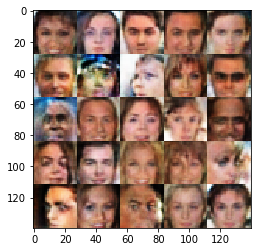

Epoch 5/10... Discriminator Loss: 1.5182... Generator Loss: 0.4045
Epoch 5/10... Discriminator Loss: 1.5811... Generator Loss: 0.4930
Epoch 5/10... Discriminator Loss: 1.3900... Generator Loss: 0.7360
Epoch 5/10... Discriminator Loss: 1.8052... Generator Loss: 0.3840
Epoch 5/10... Discriminator Loss: 1.7286... Generator Loss: 0.3559
Epoch 5/10... Discriminator Loss: 1.3119... Generator Loss: 0.6863
Epoch 5/10... Discriminator Loss: 1.6198... Generator Loss: 0.6590
Epoch 5/10... Discriminator Loss: 1.5053... Generator Loss: 0.5724
Epoch 5/10... Discriminator Loss: 1.5895... Generator Loss: 0.5378
Epoch 5/10... Discriminator Loss: 1.4016... Generator Loss: 0.8509


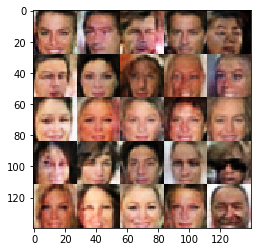

Epoch 5/10... Discriminator Loss: 1.6328... Generator Loss: 0.4472
Epoch 5/10... Discriminator Loss: 1.5611... Generator Loss: 0.5362
Epoch 5/10... Discriminator Loss: 1.5960... Generator Loss: 0.5194
Epoch 5/10... Discriminator Loss: 1.2878... Generator Loss: 0.6495
Epoch 5/10... Discriminator Loss: 1.4236... Generator Loss: 0.6402
Epoch 5/10... Discriminator Loss: 1.4741... Generator Loss: 0.6657
Epoch 5/10... Discriminator Loss: 1.7035... Generator Loss: 0.3645
Epoch 5/10... Discriminator Loss: 1.3966... Generator Loss: 0.6944
Epoch 5/10... Discriminator Loss: 1.5702... Generator Loss: 0.6578
Epoch 5/10... Discriminator Loss: 1.7868... Generator Loss: 0.2996


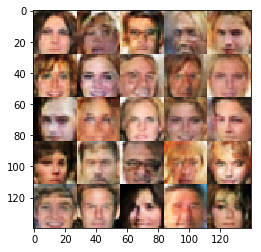

Epoch 5/10... Discriminator Loss: 1.8796... Generator Loss: 0.4148
Epoch 5/10... Discriminator Loss: 1.8688... Generator Loss: 0.3180
Epoch 5/10... Discriminator Loss: 1.7690... Generator Loss: 0.3356
Epoch 5/10... Discriminator Loss: 1.6236... Generator Loss: 0.3886
Epoch 5/10... Discriminator Loss: 1.6267... Generator Loss: 0.5358
Epoch 5/10... Discriminator Loss: 1.6758... Generator Loss: 0.5303
Epoch 5/10... Discriminator Loss: 1.4605... Generator Loss: 0.7182
Epoch 5/10... Discriminator Loss: 1.6469... Generator Loss: 0.4571
Epoch 5/10... Discriminator Loss: 2.0664... Generator Loss: 0.3564
Epoch 5/10... Discriminator Loss: 1.6690... Generator Loss: 0.4239


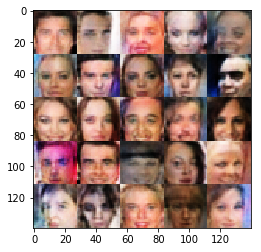

Epoch 5/10... Discriminator Loss: 1.7591... Generator Loss: 0.4158
Epoch 5/10... Discriminator Loss: 1.9096... Generator Loss: 0.2538
Epoch 5/10... Discriminator Loss: 1.4536... Generator Loss: 0.6098
Epoch 5/10... Discriminator Loss: 1.4995... Generator Loss: 0.6727
Epoch 5/10... Discriminator Loss: 1.8217... Generator Loss: 0.3126
Epoch 5/10... Discriminator Loss: 1.6301... Generator Loss: 0.4033
Epoch 5/10... Discriminator Loss: 1.9267... Generator Loss: 0.3675
Epoch 5/10... Discriminator Loss: 1.4486... Generator Loss: 0.6599
Epoch 5/10... Discriminator Loss: 1.6595... Generator Loss: 0.5251
Epoch 5/10... Discriminator Loss: 1.6167... Generator Loss: 0.4076


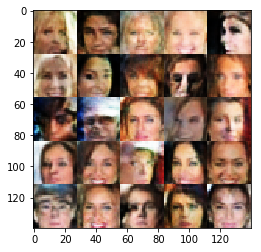

Epoch 5/10... Discriminator Loss: 1.5558... Generator Loss: 0.4188
Epoch 5/10... Discriminator Loss: 1.2974... Generator Loss: 1.5997
Epoch 5/10... Discriminator Loss: 1.7520... Generator Loss: 0.4818
Epoch 5/10... Discriminator Loss: 1.6391... Generator Loss: 0.3693
Epoch 5/10... Discriminator Loss: 1.5699... Generator Loss: 0.4548
Epoch 5/10... Discriminator Loss: 1.9764... Generator Loss: 0.3565
Epoch 5/10... Discriminator Loss: 1.5207... Generator Loss: 0.4574
Epoch 5/10... Discriminator Loss: 1.9040... Generator Loss: 0.3454
Epoch 5/10... Discriminator Loss: 1.5977... Generator Loss: 0.4690
Epoch 5/10... Discriminator Loss: 1.7553... Generator Loss: 0.3846


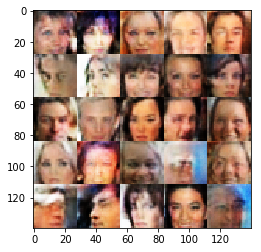

Epoch 5/10... Discriminator Loss: 1.7203... Generator Loss: 0.4921
Epoch 5/10... Discriminator Loss: 1.4937... Generator Loss: 0.5738
Epoch 5/10... Discriminator Loss: 1.8579... Generator Loss: 0.4373
Epoch 5/10... Discriminator Loss: 1.6065... Generator Loss: 0.4911
Epoch 5/10... Discriminator Loss: 1.9561... Generator Loss: 0.3431
Epoch 5/10... Discriminator Loss: 1.2731... Generator Loss: 0.8895
Epoch 5/10... Discriminator Loss: 1.5091... Generator Loss: 0.6310
Epoch 5/10... Discriminator Loss: 1.6813... Generator Loss: 0.4769
Epoch 5/10... Discriminator Loss: 1.7938... Generator Loss: 0.3934
Epoch 5/10... Discriminator Loss: 1.8141... Generator Loss: 0.4116


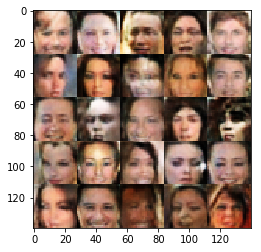

Epoch 5/10... Discriminator Loss: 1.5795... Generator Loss: 0.4777
Epoch 5/10... Discriminator Loss: 2.0274... Generator Loss: 0.2522
Epoch 5/10... Discriminator Loss: 1.6546... Generator Loss: 0.5660
Epoch 5/10... Discriminator Loss: 1.2903... Generator Loss: 0.7623
Epoch 5/10... Discriminator Loss: 1.3844... Generator Loss: 0.5251
Epoch 5/10... Discriminator Loss: 1.8557... Generator Loss: 0.3029
Epoch 5/10... Discriminator Loss: 1.9314... Generator Loss: 0.3249
Epoch 5/10... Discriminator Loss: 1.4200... Generator Loss: 0.8516
Epoch 5/10... Discriminator Loss: 1.7090... Generator Loss: 0.4389
Epoch 5/10... Discriminator Loss: 1.8588... Generator Loss: 0.3238


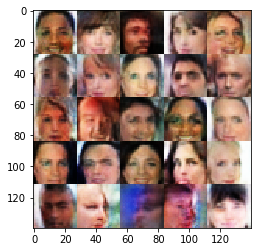

Epoch 5/10... Discriminator Loss: 1.3884... Generator Loss: 0.5265
Epoch 5/10... Discriminator Loss: 1.6976... Generator Loss: 0.3785
Epoch 5/10... Discriminator Loss: 1.5901... Generator Loss: 0.5728
Epoch 5/10... Discriminator Loss: 1.3541... Generator Loss: 0.6995
Epoch 5/10... Discriminator Loss: 1.8294... Generator Loss: 0.3335
Epoch 5/10... Discriminator Loss: 1.7254... Generator Loss: 0.3397
Epoch 5/10... Discriminator Loss: 1.6761... Generator Loss: 0.4403
Epoch 5/10... Discriminator Loss: 1.7016... Generator Loss: 0.3493
Epoch 5/10... Discriminator Loss: 1.8607... Generator Loss: 0.3100
Epoch 5/10... Discriminator Loss: 1.6052... Generator Loss: 0.4563


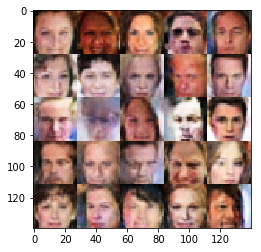

Epoch 5/10... Discriminator Loss: 1.6311... Generator Loss: 0.4358
Epoch 5/10... Discriminator Loss: 1.1871... Generator Loss: 0.8644
Epoch 5/10... Discriminator Loss: 1.4807... Generator Loss: 0.5933
Epoch 5/10... Discriminator Loss: 2.0363... Generator Loss: 0.2654
Epoch 5/10... Discriminator Loss: 1.2986... Generator Loss: 0.8748
Epoch 5/10... Discriminator Loss: 1.9193... Generator Loss: 0.2934
Epoch 5/10... Discriminator Loss: 1.4637... Generator Loss: 0.4948
Epoch 5/10... Discriminator Loss: 1.4606... Generator Loss: 0.6729
Epoch 5/10... Discriminator Loss: 1.6922... Generator Loss: 0.3488
Epoch 5/10... Discriminator Loss: 1.6281... Generator Loss: 0.4413


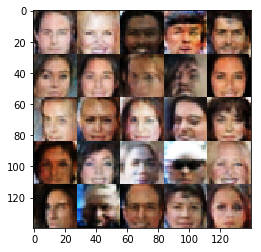

Epoch 5/10... Discriminator Loss: 2.0321... Generator Loss: 0.3102
Epoch 5/10... Discriminator Loss: 1.6064... Generator Loss: 0.4414
Epoch 5/10... Discriminator Loss: 1.8599... Generator Loss: 0.2996
Epoch 5/10... Discriminator Loss: 1.8067... Generator Loss: 0.3048
Epoch 5/10... Discriminator Loss: 1.5110... Generator Loss: 0.5488


KeyboardInterrupt: 

In [92]:
batch_size = 64
z_dim = 100
learning_rate = 0.00015
beta1 = 0.6


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.